## Select GPU for training 

In [1]:
import tensorflow as tf
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2.1.0
Num GPUs Available:  1


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPU


## Import request package

In [3]:
import os
import cv2
import glob
import shutil
import random

import numpy as np
import matplotlib.pyplot as plt

from model import *
from data import *
from tqdm import tqdm
from datetime import datetime



import tensorflow as tf
tf.__version__

Using TensorFlow backend.


'2.1.0'

## K-fold-learning hyperparameter

In [4]:
k = 6
#K-fold default

train_image_folder = 'D:/Lab/PBL/buccal/buccal_furcation_train/image'
train_label_folder = 'D:/Lab/PBL/buccal/buccal_furcation_train/label'
k_fold_data_save_path = 'D:/Lab/PBL/buccal/buccal_furcation_train'
k_fold_folder_name = 'k_fold_learning'
#load data and split K group

model_save_path = 'kfold/'
model_save_name = 'buccal_furcation_bi_unet_k-fold-learning'
model_save_tpye = '.hdf5'
# model will be save in 'model_save_path+model_save_name_{K}+model_save_tpye


## K-fold folder build

In [5]:
# if show create finish!! can keep going next step
if not os.path.isdir(os.path.join(k_fold_data_save_path, k_fold_folder_name)):
    try:
        k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
        os.makedirs(k_fold_folder_path)
        for i in range(k):
            os.makedirs(os.path.join(k_fold_folder_path,'group{}'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/image'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/label'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/aug'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/image'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/label'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/prediction'.format(i+1)))
        print('{} create finish!!'.format(k_fold_folder_name))
    except:
        print('{} build error'.format(k_fold_folder_name))
else:
    print('{} already exist'.format(k_fold_folder_name))

k_fold_learning already exist


## Assign data in k group

In [6]:
traing_image_list = glob.glob(train_image_folder+'/*.PNG')
#traing_image_list.sort()
random.shuffle (traing_image_list)

total_data_len = len(traing_image_list)
batch_num = total_data_len/k

for index,img_path in enumerate(tqdm(traing_image_list, total = total_data_len)):
    #data in other group 
    group_list = [i+1 for i in range(k)]
    group_list.pop(int(index/batch_num))
    for group in group_list:
        img_dst = os.path.join(k_fold_folder_path,'group{}/image'.format(group))
        shutil.copy2(img_path,img_dst)
        label_path = img_path.replace(train_image_folder,train_label_folder)
        label_dst = img_dst.replace('image','label')
        shutil.copy2(label_path,label_dst)
    
    
    #put data in skip_data path 
    skip_img_dst = os.path.join(k_fold_folder_path,'group{}/skip_data/image'.format(int(index/batch_num)+1))
    shutil.copy2(img_path,skip_img_dst)
    skip_label_path = img_path.replace(train_image_folder,train_label_folder)
    skip_label_dst = skip_img_dst.replace('image','label')
    shutil.copy2(skip_label_path,skip_label_dst)
print('Data in {} groups'.format(k))

  0%|                                                                                          | 0/121 [00:00<?, ?it/s]


NameError: name 'k_fold_folder_path' is not defined

## Data augmentation in k group

In [7]:
def Data_augmentation(train_parent_folder,aug_path):
    data_gen_args = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')
    myGenerator = trainGenerator(20,train_parent_folder,'image','label',data_gen_args,save_to_dir = aug_path)
    
    num_batch = 3
    for i,batch in enumerate(myGenerator):
        if(i >= num_batch):
            break
    #image_arr,mask_arr = geneTrainNpy(aug_path,aug_path)

In [8]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)

for group_name in tqdm(group_list, total = len(group_list)):
    print('This is {}'.format(group_name))
    group_path = os.path.join(k_fold_folder_path, group_name)
    aug_path = os.path.join(group_path, 'aug')
    Data_augmentation(group_path, aug_path)

  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

This is group1
Found 100 images belonging to 1 classes.
Found 100 images belonging to 1 classes.


 17%|██████████████                                                                      | 1/6 [00:01<00:09,  1.86s/it]

This is group2
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.


 33%|████████████████████████████                                                        | 2/6 [00:03<00:07,  1.86s/it]

This is group3
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.


 50%|██████████████████████████████████████████                                          | 3/6 [00:05<00:05,  1.87s/it]

This is group4
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.


 67%|████████████████████████████████████████████████████████                            | 4/6 [00:07<00:03,  1.88s/it]

This is group5
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.


 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:09<00:01,  1.87s/it]

This is group6
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:11<00:00,  1.87s/it]


# Train Unet with training data 

In [18]:
def train_in_traindata_unet(train_parent_folder,model_save_path, model_checkpoint):
    data_gen_args = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')
    myGene = trainGenerator(3,train_parent_folder,'image','label',data_gen_args,save_to_dir = None)
    model = unet()
    model.fit_generator(myGene,steps_per_epoch=2000,epochs=20,callbacks=[model_checkpoint])
    return model

In [7]:
# model.summary()

# Train Unet with augmentation data

In [19]:
def train_in_augdata_unet(model, aug_path, model_save_path, model_checkpoint):    
    imgs_train,imgs_mask_train = geneTrainNpy(aug_path, aug_path)
    model.fit(imgs_train, imgs_mask_train, batch_size=2, nb_epoch=20, verbose=1,validation_split=0.2, shuffle=True, callbacks=[model_checkpoint])
    model.save(model_save_path)

In [20]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
#group_list = os.listdir(k_fold_folder_path)
group_list = ['group5', 'group6']

for group_name in tqdm(group_list, total = len(group_list)):
    print('Model start training in {}'.format(group_name))
    group_path = os.path.join(k_fold_folder_path, group_name)
    aug_path = os.path.join(group_path, 'aug')
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    model_checkpoint = ModelCheckpoint(model_save_total_path, monitor='loss',verbose=1, save_best_only=True)
    model = train_in_traindata_unet(group_path, model_save_total_path, model_checkpoint)
    train_in_augdata_unet(model, aug_path, model_save_total_path, model_checkpoint)

  0%|                                                                                            | 0/2 [00:00<?, ?it/s]

Model start training in group5
Epoch 1/20
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.
2000/2000 [==============================] - 333s 167ms/step - loss: 0.6460 - accuracy: 0.9959

Epoch 00001: loss improved from inf to 0.64598, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 2/20
2000/2000 [==============================] - 330s 165ms/step - loss: 0.5590 - accuracy: 0.9975

Epoch 00002: loss improved from 0.64598 to 0.55898, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 3/20
2000/2000 [==============================] - 294s 147ms/step - loss: 0.4826 - accuracy: 0.9975

Epoch 00003: loss improved from 0.55898 to 0.48262, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 4/20
2000/2000 [==============================] - 339s 170ms/step - loss: 0.4153 - accuracy: 0.9975

Epoch 00004: loss improved from 0.48262 to 0.41528, saving model to kfold/buccal_f

C:\Users\lab118\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  This is separate from the ipykernel package so we can avoid doing imports until


Train on 64 samples, validate on 16 samples
Epoch 1/20
64/64 [==============================] - 5s 73ms/step - loss: 0.0329 - accuracy: 0.9978 - val_loss: 0.0354 - val_accuracy: 0.9971

Epoch 00001: loss improved from 0.03593 to 0.03285, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 2/20
64/64 [==============================] - 5s 71ms/step - loss: 0.0328 - accuracy: 0.9978 - val_loss: 0.0353 - val_accuracy: 0.9971

Epoch 00002: loss improved from 0.03285 to 0.03279, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 3/20
64/64 [==============================] - 5s 71ms/step - loss: 0.0327 - accuracy: 0.9978 - val_loss: 0.0352 - val_accuracy: 0.9971

Epoch 00003: loss improved from 0.03279 to 0.03273, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5
Epoch 4/20
64/64 [==============================] - 5s 71ms/step - loss: 0.0327 - accuracy: 0.9978 - val_loss: 0.0352 - val_accuracy: 0.9971

Epoch 0

 50%|███████████████████████████████████████                                       | 1/2 [1:53:31<1:53:31, 6811.17s/it]

Model start training in group6
Epoch 1/20
Found 101 images belonging to 1 classes.
Found 101 images belonging to 1 classes.
2000/2000 [==============================] - 333s 167ms/step - loss: 0.0093 - accuracy: 0.9979

Epoch 00001: loss improved from inf to 0.00928, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group6.hdf5
Epoch 2/20
2000/2000 [==============================] - 334s 167ms/step - loss: 0.0032 - accuracy: 0.9988

Epoch 00002: loss improved from 0.00928 to 0.00318, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group6.hdf5
Epoch 3/20
2000/2000 [==============================] - 332s 166ms/step - loss: 0.0017 - accuracy: 0.9993

Epoch 00003: loss improved from 0.00318 to 0.00172, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group6.hdf5
Epoch 4/20
2000/2000 [==============================] - 334s 167ms/step - loss: 0.0016 - accuracy: 0.9994

Epoch 00004: loss improved from 0.00172 to 0.00162, saving model to kfold/buccal_f

64/64 [==============================] - 5s 71ms/step - loss: 1.2603e-04 - accuracy: 1.0000 - val_loss: 3.7150e-04 - val_accuracy: 0.9999

Epoch 00018: loss did not improve from 0.00009
Epoch 19/20
64/64 [==============================] - 5s 71ms/step - loss: 9.9416e-05 - accuracy: 1.0000 - val_loss: 4.1519e-04 - val_accuracy: 0.9999

Epoch 00019: loss did not improve from 0.00009
Epoch 20/20
64/64 [==============================] - 5s 71ms/step - loss: 6.6186e-05 - accuracy: 1.0000 - val_loss: 3.8549e-04 - val_accuracy: 0.9999

Epoch 00020: loss improved from 0.00009 to 0.00007, saving model to kfold/buccal_furcation_bi_unet_k-fold-learning_group6.hdf5


100%|████████████████████████████████████████████████████████████████████████████████| 2/2 [3:46:23<00:00, 6791.68s/it]


### test your model and save predicted results

In [5]:
from model import *
from data import *
from datetime import datetime
from tqdm import tqdm

import os
import tensorflow as tf
tf.__version__

'2.1.0'

In [6]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPU


In [7]:
def ensemble_bin(img, model_list, flip_ = False):
    ensemble_final_result = np.zeros((img.shape[0], img.shape[1],1), dtype = 'float32')
    for index, model in enumerate(model_list):
        pr_img = model.predict(img)
        sqpr_img = np.squeeze(pr_img)
        ensemble_img = sqpr_img.copy()
        if flip_:
            imgp = np.squeeze(img)
            h_flip = cv2.flip(imgp, 1)
            h_flip = np.expand_dims(h_flip, axis=(0,3))
            pre_h_flip = model.predict(h_flip)
            pre_h_flip = np.squeeze(pre_h_flip)
            h_flip = cv2.flip(pre_h_flip, 1)

            v_flip = cv2.flip(imgp, 0)
            v_flip = np.expand_dims(v_flip, axis=(0,3))
            pre_v_flip = model.predict(v_flip)
            pre_v_flip = np.squeeze(pre_v_flip)
            v_flip = cv2.flip(pre_v_flip, 0)

            hv_flip = cv2.flip(imgp, -1)
            hv_flip = np.expand_dims(hv_flip, axis=(0,3))
            pre_hv_flip = model.predict(hv_flip)
            pre_hv_flip = np.squeeze(pre_hv_flip)
            hv_flip = cv2.flip(pre_hv_flip, -1)
            ensemble_img = (sqpr_img+h_flip+v_flip+hv_flip)/4
        ensemble_final_result = ensemble_final_result+ensemble_img
    ensemble_final_result = ensemble_final_result/(index+1)
    return np.expand_dims(np.where(ensemble_final_result > 0.5, 255, 0), axis=(0,3))

In [8]:
import os 
import shutil

import skimage.io as io
import skimage.transform as trans

from tqdm import tqdm

def test_k_group_in_skip_data(test_folder, result_folder, model_save_path):
    model = unet()
    model.load_weights(model_save_path)
    model_list = [model]
    model_fit_img_size = (256,256)
    test_img_path_list = glob.glob(test_folder+'/*.PNG')
    for img_path in tqdm(test_img_path_list, total = len(test_img_path_list)):
        #print(img_path)
        img = io.imread(img_path,as_gray = True)
        targe_size = img.shape
        img = trans.resize(img,model_fit_img_size)
        img = np.expand_dims(img, axis=(0,3))
        img_esemble = ensemble_bin(img,model_list,flip_ = False)
        img_esemble = np.squeeze(img_esemble)
        #print(result_folder+'/{}'.format(img_path.split('/')[-1]))
        #cv2.imwrite('D:/Lab/PBL/buccal/buccal_furcation_train/k_fold_learning/group3/skip_data/prediction/123.PNG',img_esemble)
        strname = result_folder+'/{}'.format(img_path.split('\\')[-1])
#         strname = strname.replace('\\', '/')
        #print(strname)
        cv2.imwrite(strname,img_esemble)

In [14]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
#group_list = ['group5','group6']

for group_name in tqdm(group_list, total = len(group_list)):
    test_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'image')
    result_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'prediction')
    print(test_folder)
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    test_k_group_in_skip_data(test_folder, result_folder, model_save_total_path)

  0%|                                                                                            | 0/6 [00:00<?, ?it/s]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group1\skip_data\image



 17%|██████████████                                                                      | 1/6 [00:01<00:05,  1.09s/it]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group2\skip_data\image



 33%|████████████████████████████                                                        | 2/6 [00:02<00:04,  1.05s/it]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group3\skip_data\image



 50%|██████████████████████████████████████████                                          | 3/6 [00:02<00:03,  1.01s/it]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group4\skip_data\image



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:03<00:01,  1.02it/s]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group5\skip_data\image



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:04<00:00,  1.04it/s]

D:/Lab/PBL/buccal/buccal_furcation_train\k_fold_learning\group6\skip_data\image



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:05<00:00,  1.05it/s]


In [21]:
# !conda install -y graphviz

In [15]:
#show testing result
import os
import cv2
import skimage.io as io
import skimage.transform as trans
import matplotlib.pyplot as plt


def show_k_fold_result(test_img_path_list):
    for img_path in tqdm(test_img_path_list, total = len(test_img_path_list)):
        #print(img_path)
        img = cv2.imread(img_path,0)
        predict_img = cv2.imread(img_path.replace('image','prediction'),0)
        human_label = cv2.imread(img_path.replace('image','label'),0)
        plt.figure(figsize = (20,20))
        plt.subplot(131)
        plt.title('original_test_img')
        plt.imshow(img, cmap='gray')
        plt.subplot(132)
        plt.title('predict_test_img')
        #print(human_label)
        plt.imshow(predict_img, cmap='gray')
        plt.subplot(133)
        plt.title('human_label')
        plt.imshow(human_label, cmap='gray')
        plt.show()

  0%|                                                                                           | 0/21 [00:00<?, ?it/s]

group name = group1


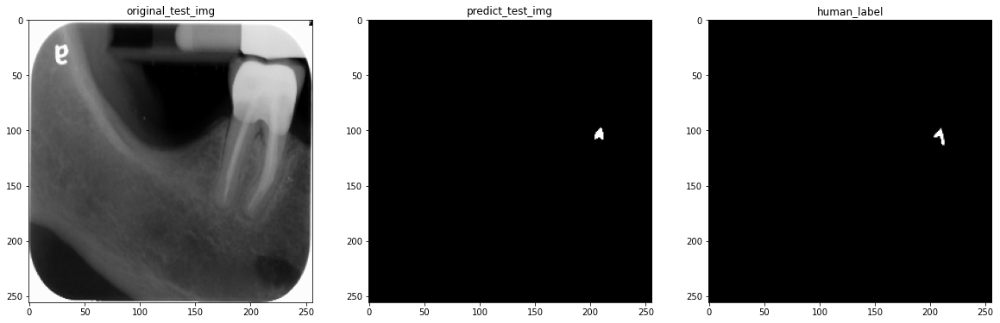


  5%|███▉                                                                               | 1/21 [00:00<00:06,  3.01it/s]

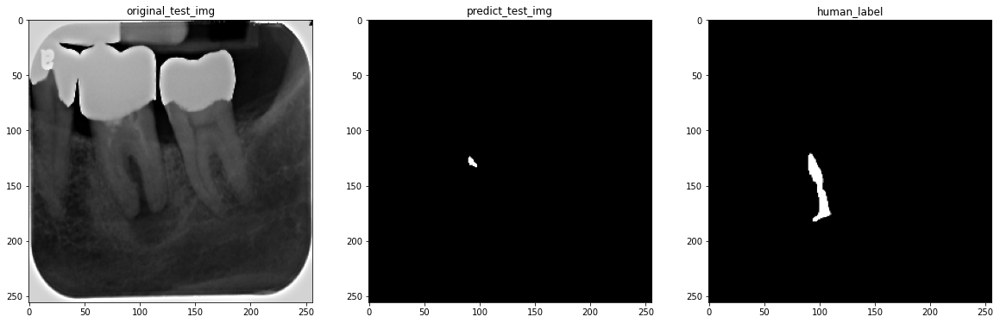


 10%|███████▉                                                                           | 2/21 [00:00<00:06,  3.06it/s]

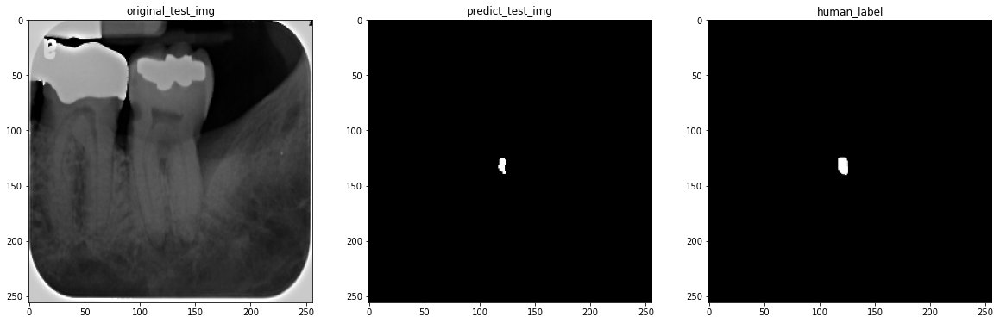


 14%|███████████▊                                                                       | 3/21 [00:00<00:05,  3.05it/s]

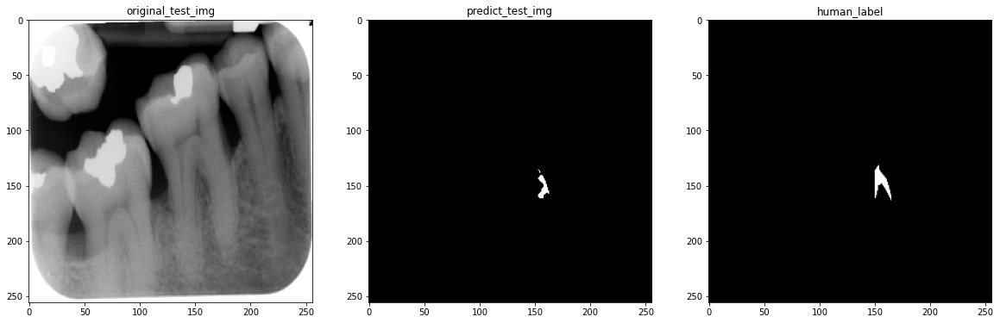


 19%|███████████████▊                                                                   | 4/21 [00:01<00:05,  3.04it/s]

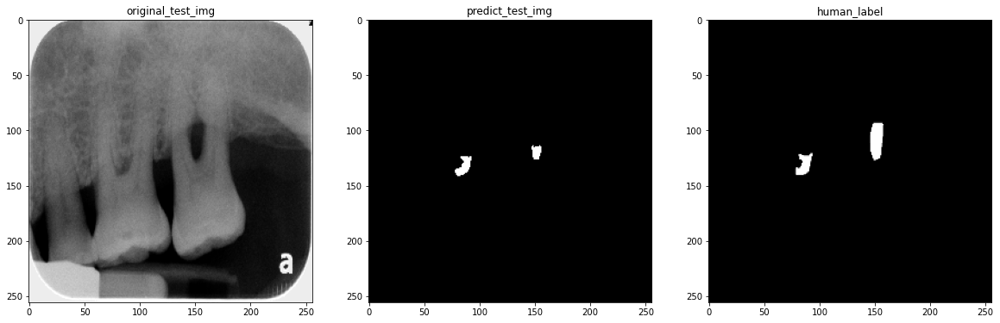


 24%|███████████████████▊                                                               | 5/21 [00:01<00:05,  2.79it/s]

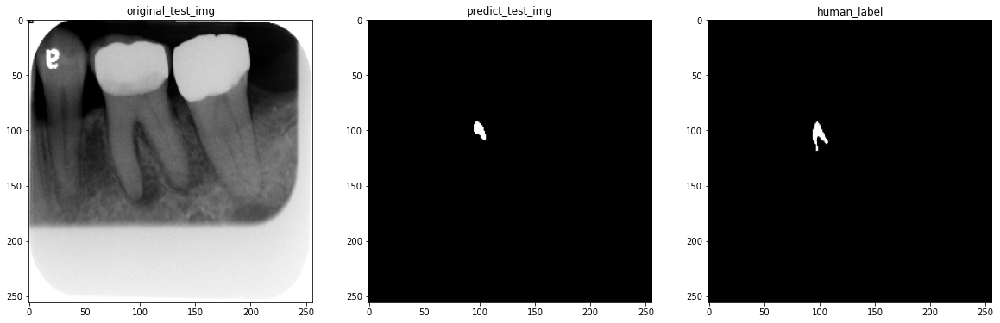


 29%|███████████████████████▋                                                           | 6/21 [00:02<00:05,  2.86it/s]

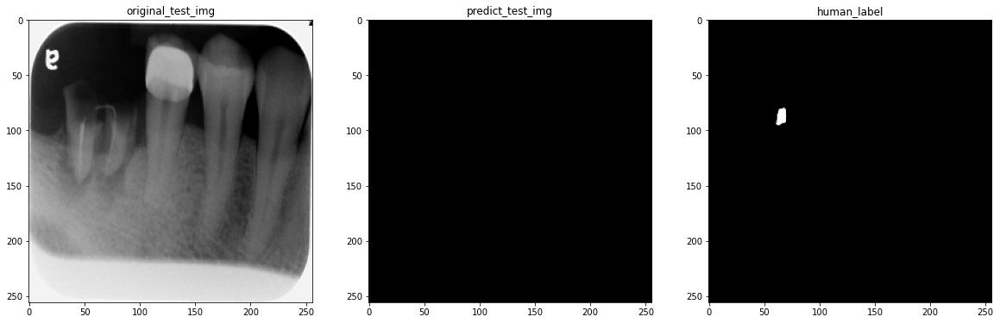


 33%|███████████████████████████▋                                                       | 7/21 [00:02<00:04,  2.91it/s]

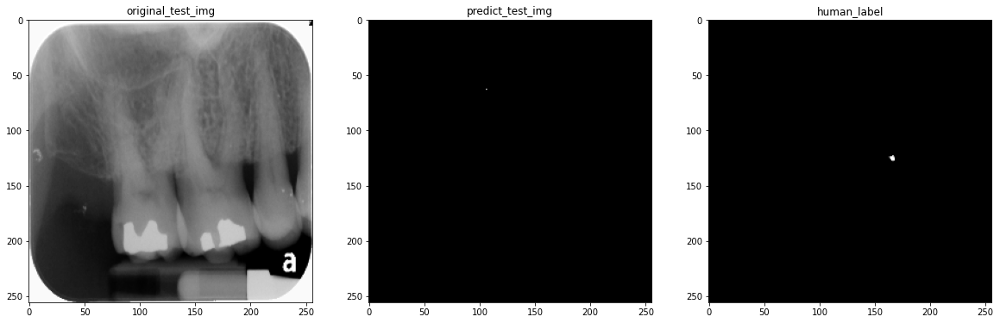


 38%|███████████████████████████████▌                                                   | 8/21 [00:02<00:04,  2.94it/s]

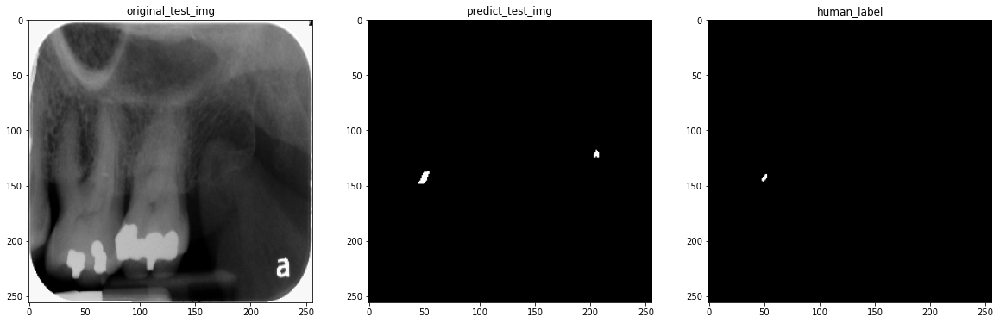


 43%|███████████████████████████████████▌                                               | 9/21 [00:03<00:04,  2.96it/s]

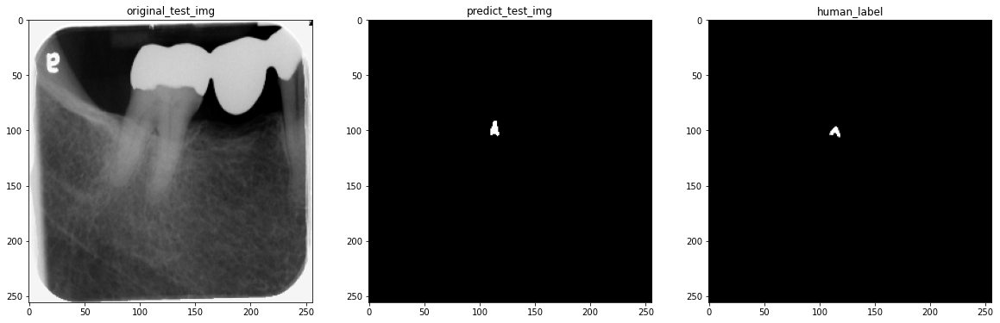


 48%|███████████████████████████████████████                                           | 10/21 [00:03<00:03,  2.98it/s]

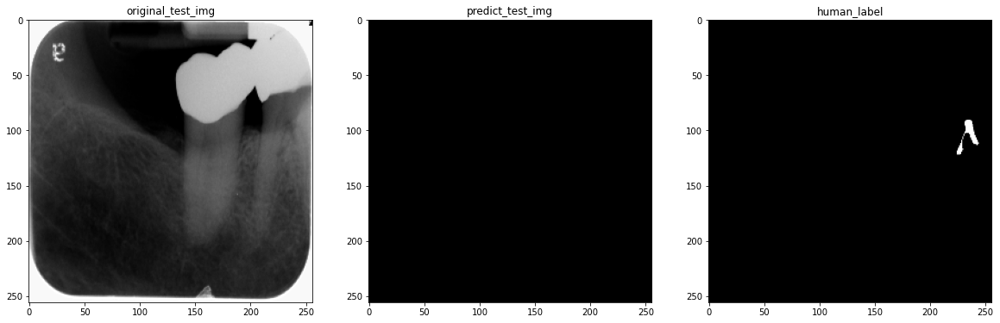


 52%|██████████████████████████████████████████▉                                       | 11/21 [00:03<00:03,  3.04it/s]

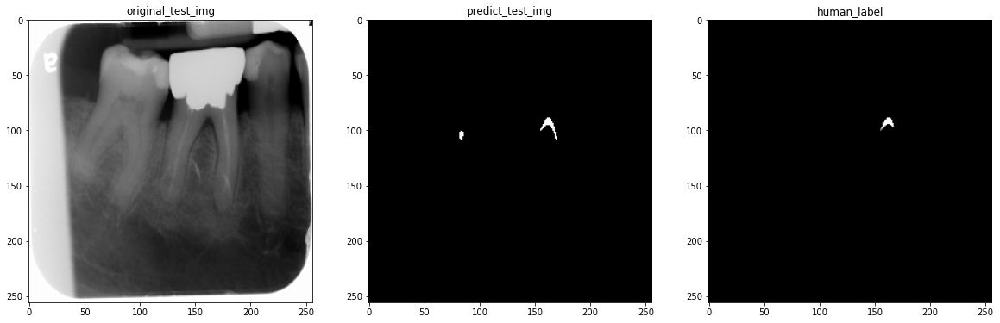


 57%|██████████████████████████████████████████████▊                                   | 12/21 [00:04<00:02,  3.04it/s]

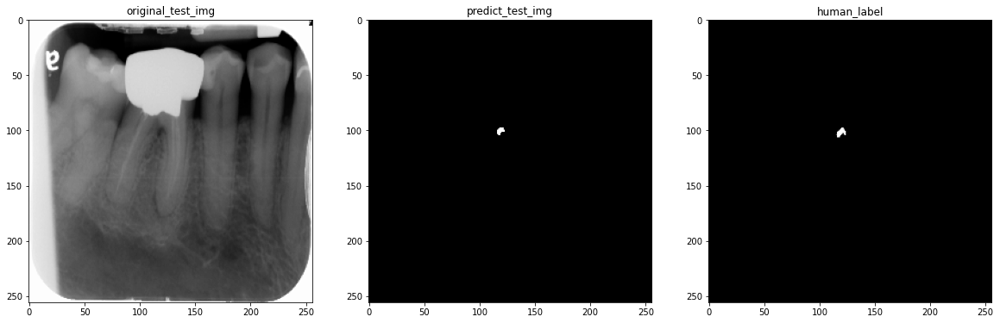


 62%|██████████████████████████████████████████████████▊                               | 13/21 [00:04<00:02,  3.03it/s]

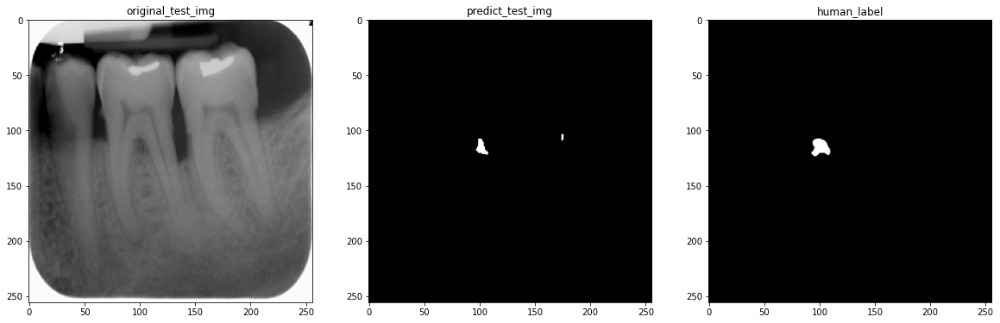


 67%|██████████████████████████████████████████████████████▋                           | 14/21 [00:04<00:02,  3.08it/s]

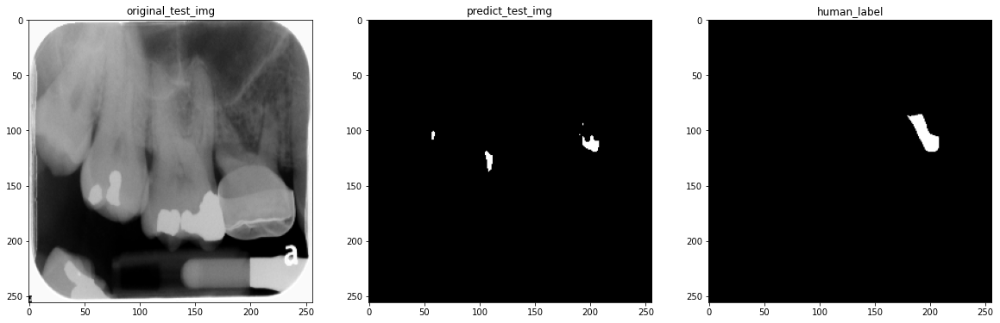


 71%|██████████████████████████████████████████████████████████▌                       | 15/21 [00:05<00:01,  3.06it/s]

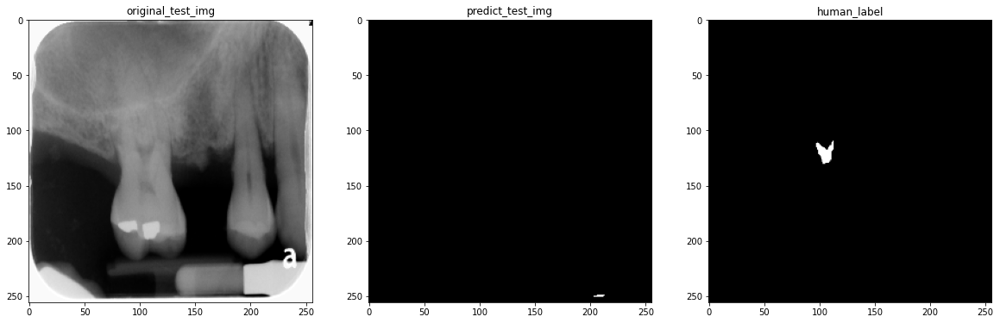


 76%|██████████████████████████████████████████████████████████████▍                   | 16/21 [00:05<00:01,  3.01it/s]

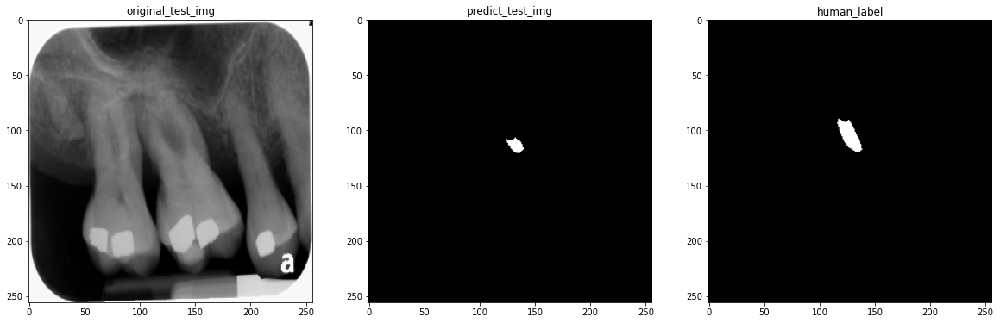


 81%|██████████████████████████████████████████████████████████████████▍               | 17/21 [00:05<00:01,  2.78it/s]

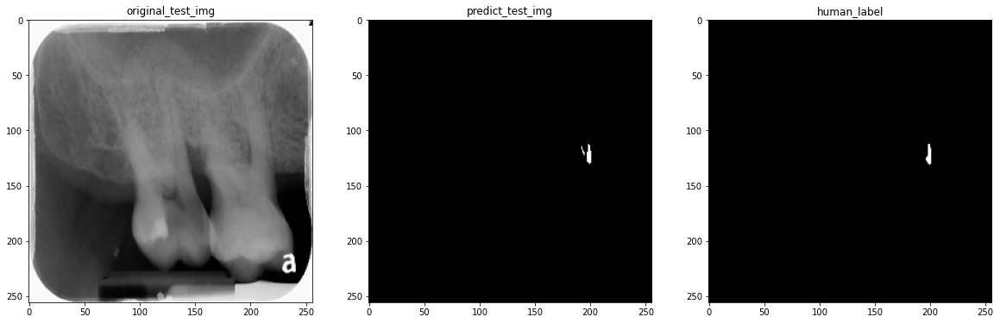


 86%|██████████████████████████████████████████████████████████████████████▎           | 18/21 [00:06<00:01,  2.85it/s]

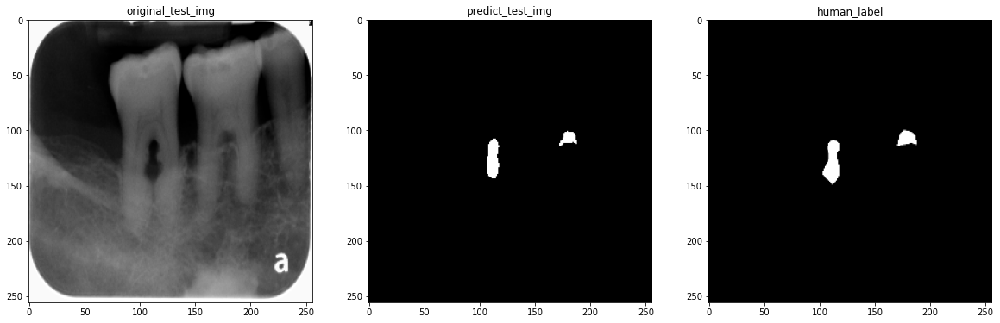


 90%|██████████████████████████████████████████████████████████████████████████▏       | 19/21 [00:06<00:00,  2.94it/s]

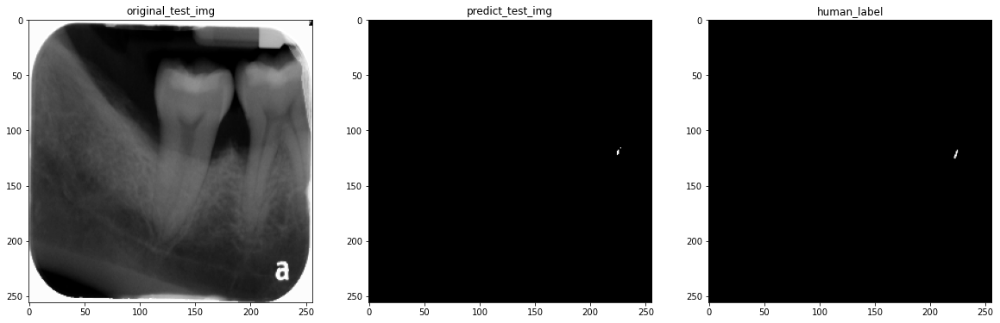


 95%|██████████████████████████████████████████████████████████████████████████████    | 20/21 [00:06<00:00,  2.96it/s]

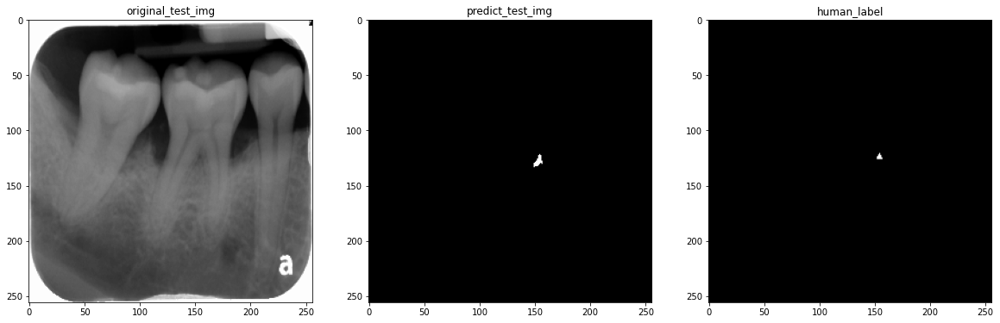


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

group name = group2


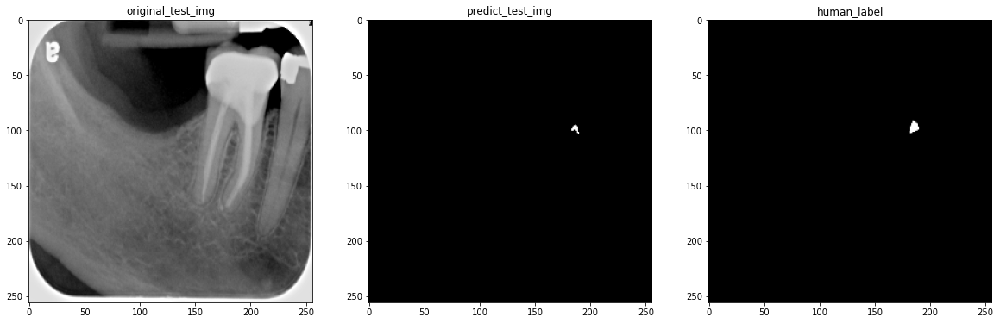


  5%|████▏                                                                              | 1/20 [00:00<00:05,  3.18it/s]

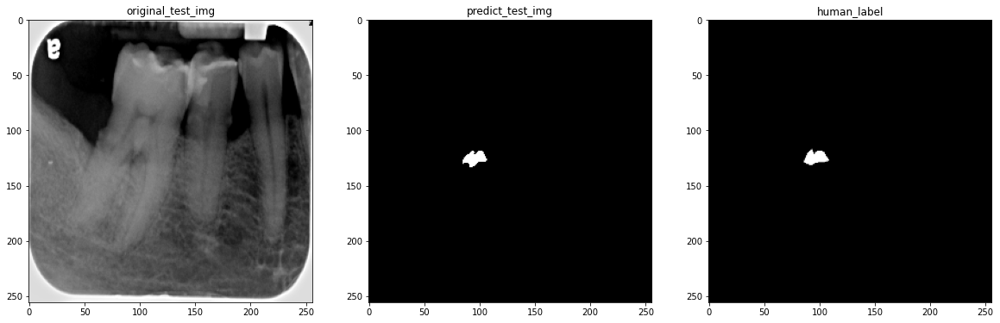


 10%|████████▎                                                                          | 2/20 [00:00<00:05,  3.14it/s]

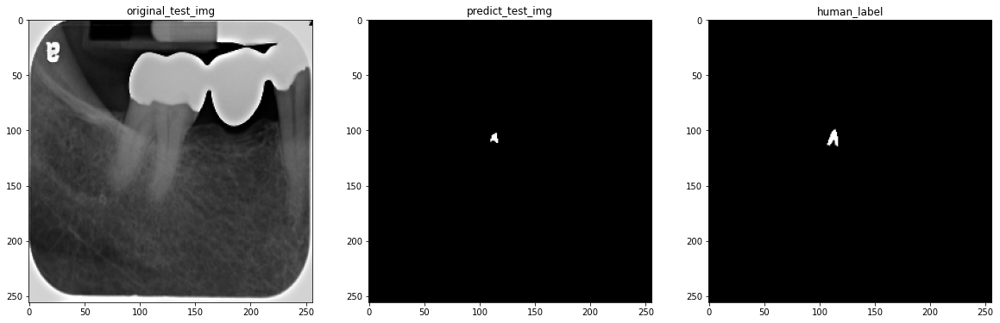


 15%|████████████▍                                                                      | 3/20 [00:00<00:05,  3.06it/s]

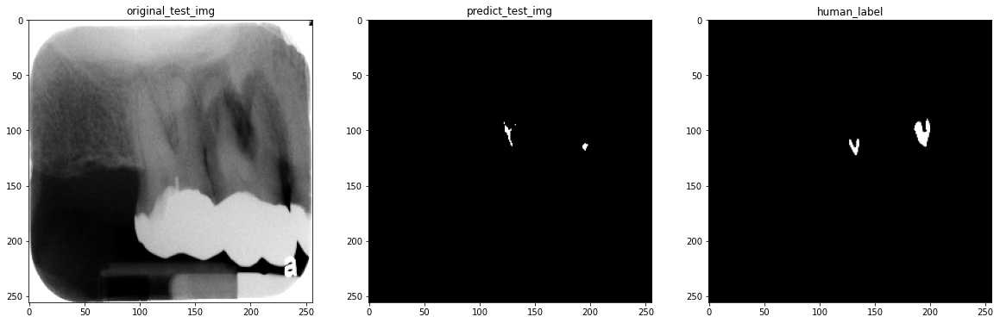


 20%|████████████████▌                                                                  | 4/20 [00:01<00:05,  3.05it/s]

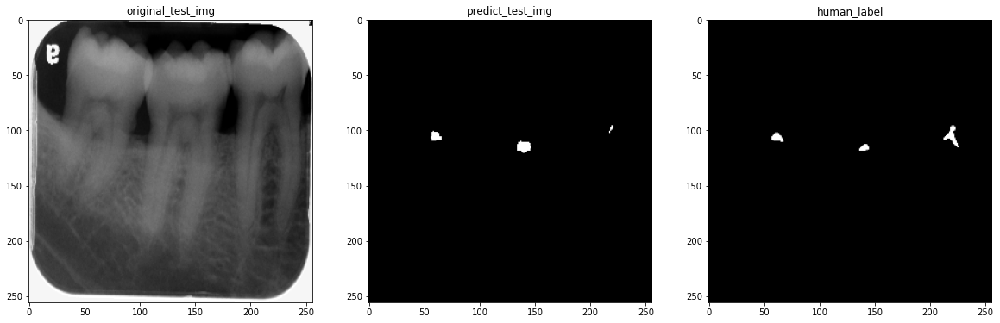


 25%|████████████████████▊                                                              | 5/20 [00:01<00:04,  3.04it/s]

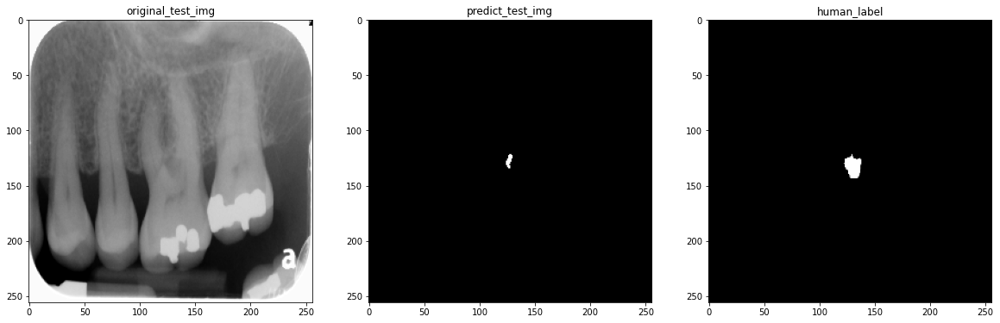


 30%|████████████████████████▉                                                          | 6/20 [00:01<00:04,  3.03it/s]

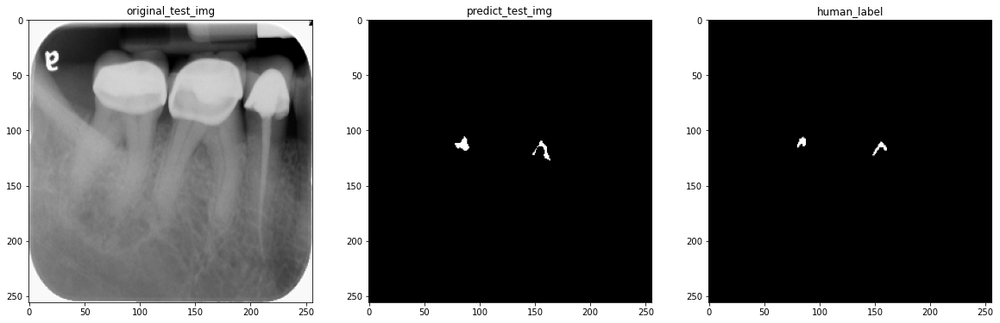


 35%|█████████████████████████████                                                      | 7/20 [00:02<00:04,  2.99it/s]

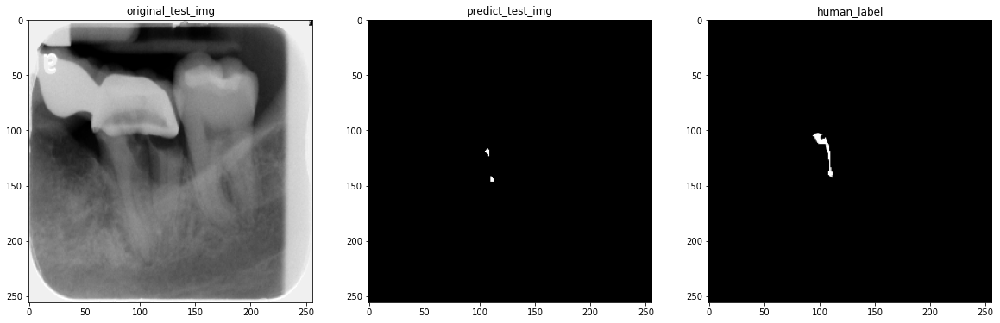


 40%|█████████████████████████████████▏                                                 | 8/20 [00:02<00:04,  2.75it/s]

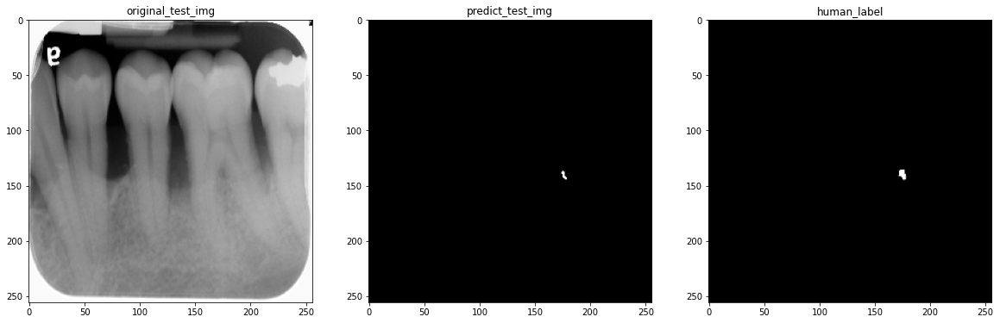


 45%|█████████████████████████████████████▎                                             | 9/20 [00:03<00:03,  2.84it/s]

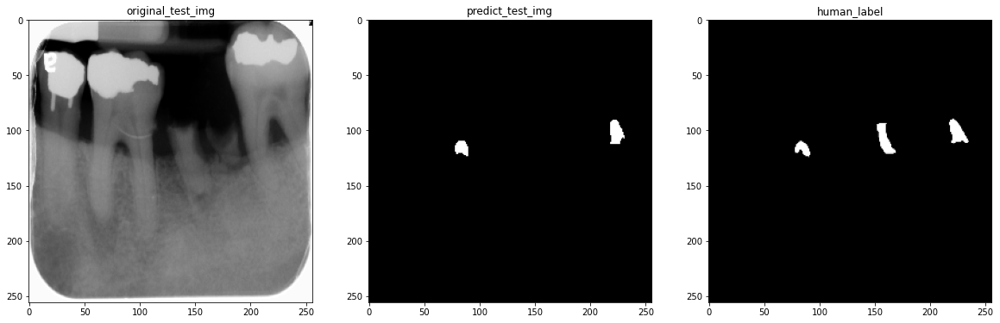


 50%|█████████████████████████████████████████                                         | 10/20 [00:03<00:03,  2.80it/s]

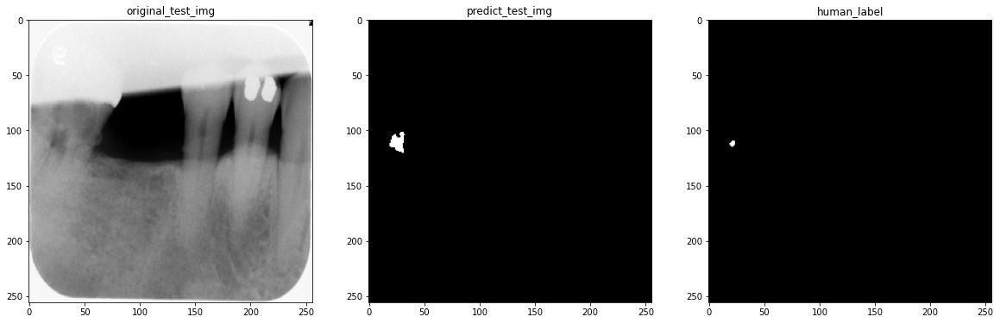


 55%|█████████████████████████████████████████████                                     | 11/20 [00:03<00:03,  2.83it/s]

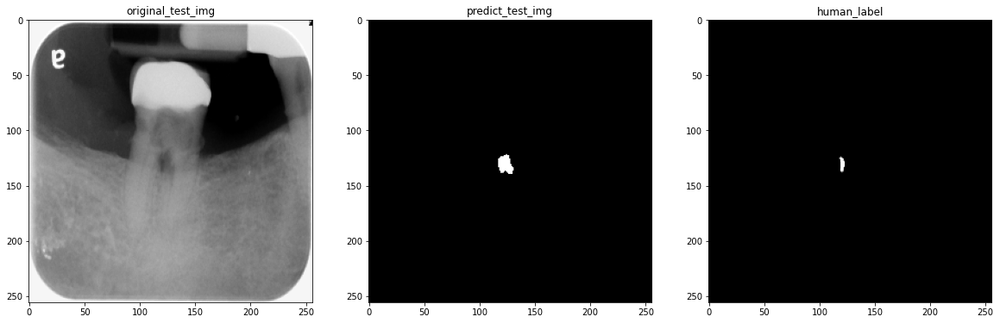


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:04<00:02,  2.92it/s]

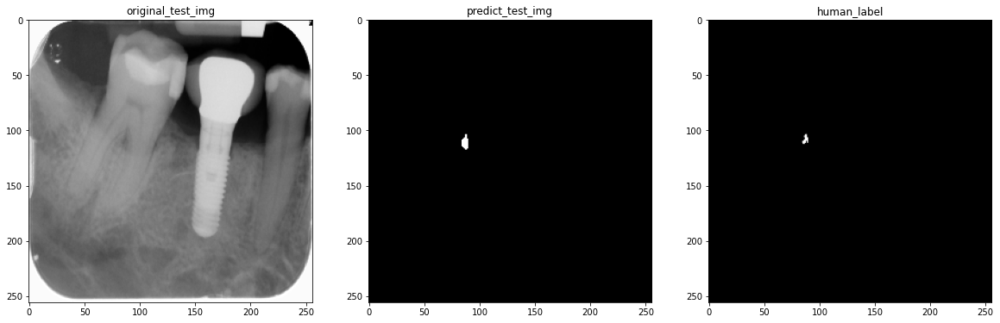


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [00:04<00:02,  2.95it/s]

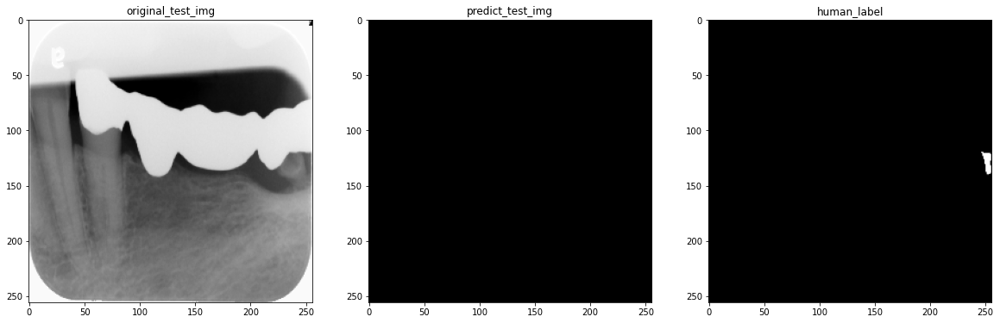


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:04<00:02,  2.93it/s]

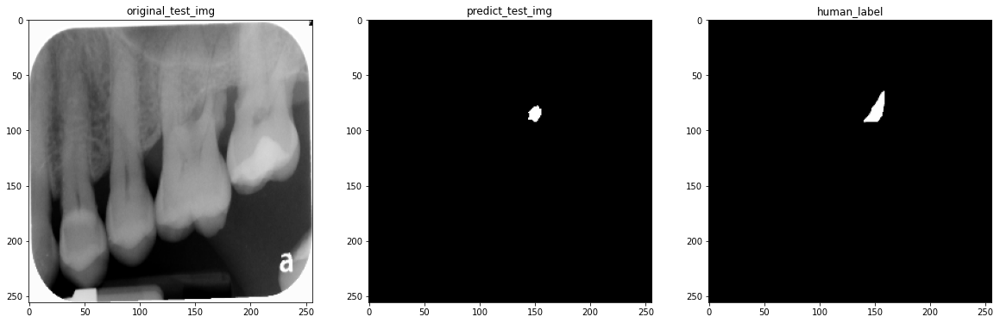


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [00:05<00:01,  2.96it/s]

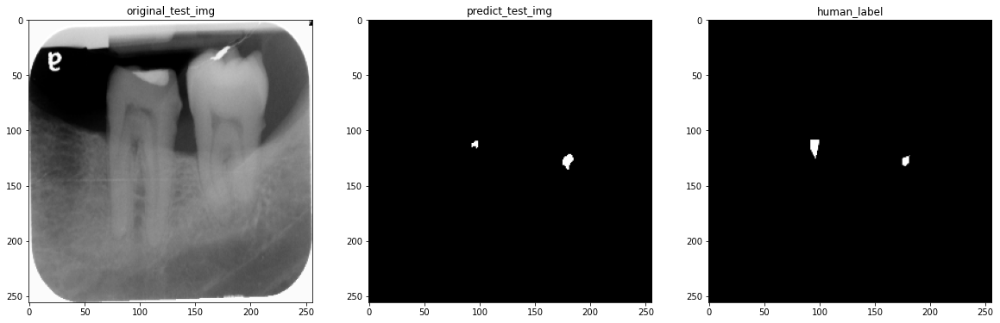


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:05<00:01,  3.02it/s]

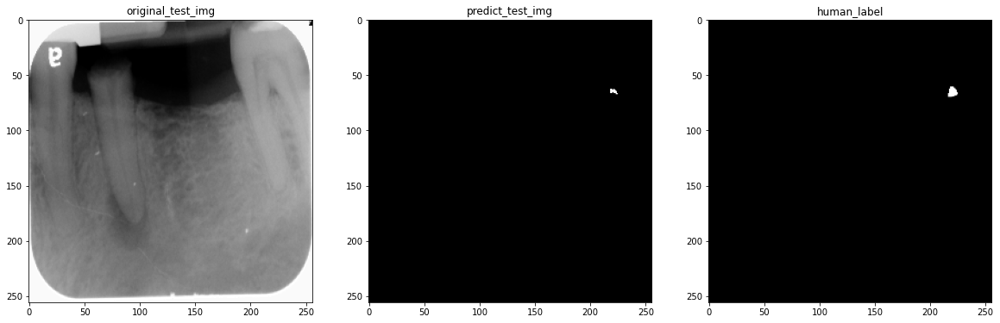


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [00:05<00:00,  3.02it/s]

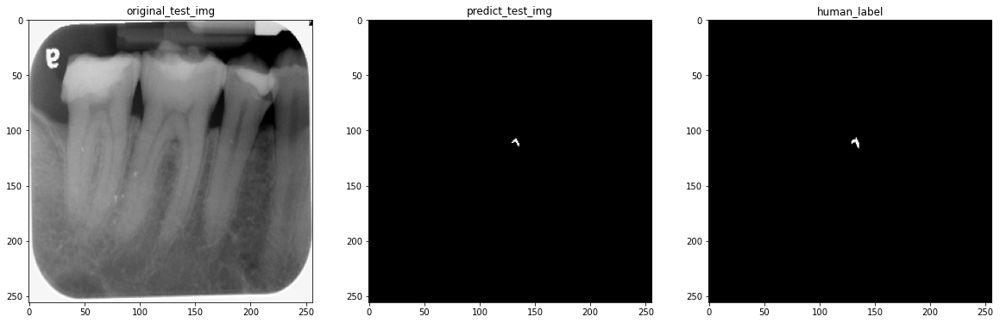


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:06<00:00,  2.98it/s]

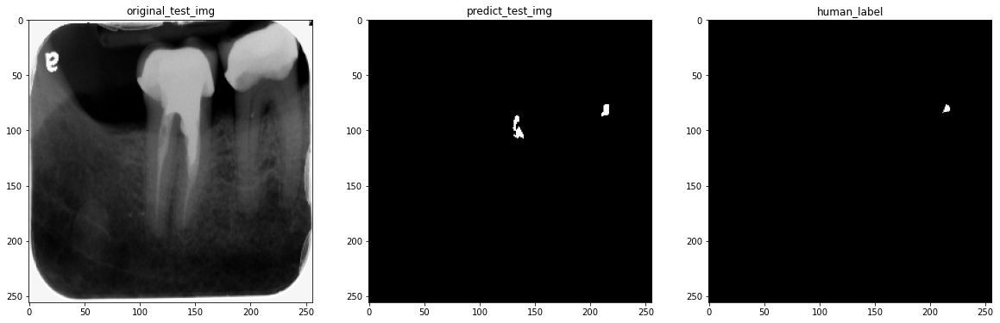


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [00:06<00:00,  2.99it/s]

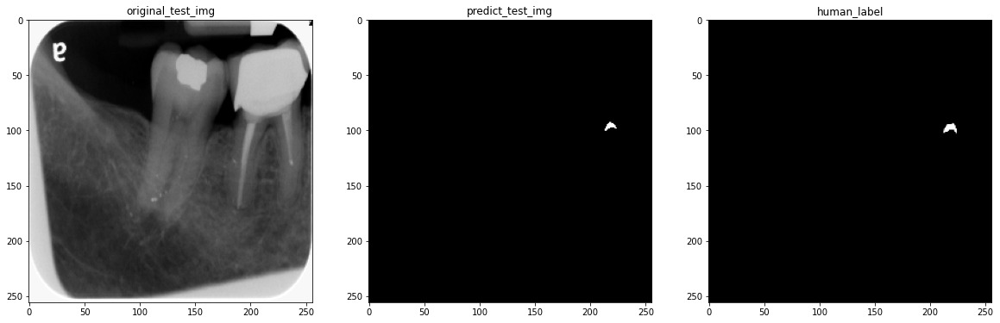


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

group name = group3


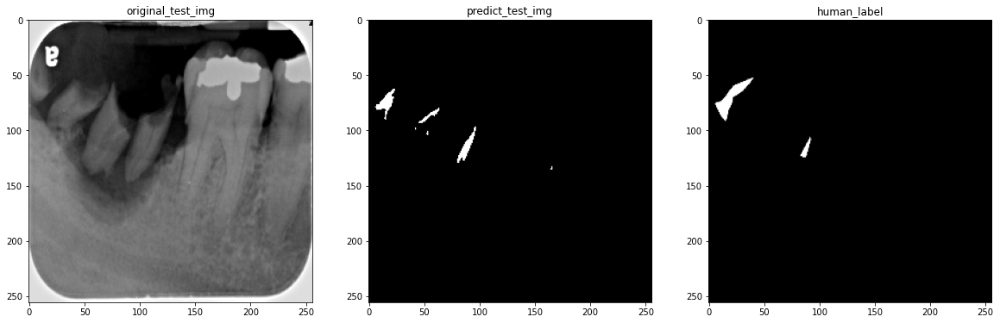


  5%|████▏                                                                              | 1/20 [00:00<00:06,  2.90it/s]

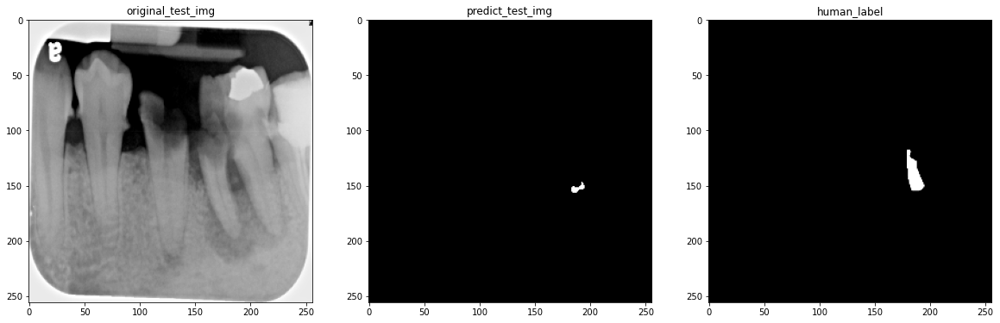


 10%|████████▎                                                                          | 2/20 [00:00<00:06,  2.94it/s]

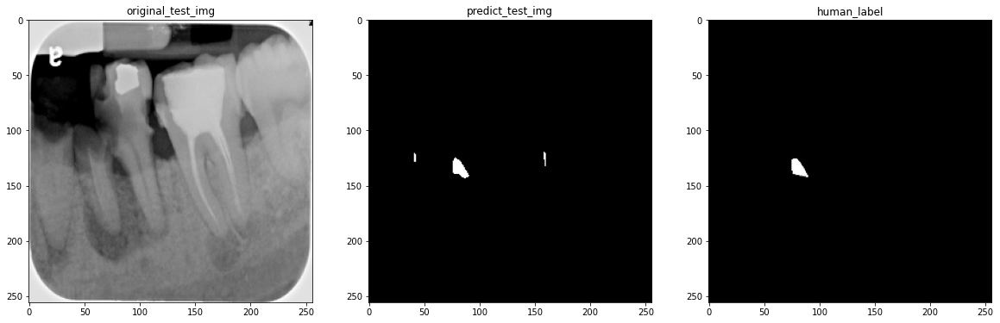


 15%|████████████▍                                                                      | 3/20 [00:01<00:05,  2.92it/s]

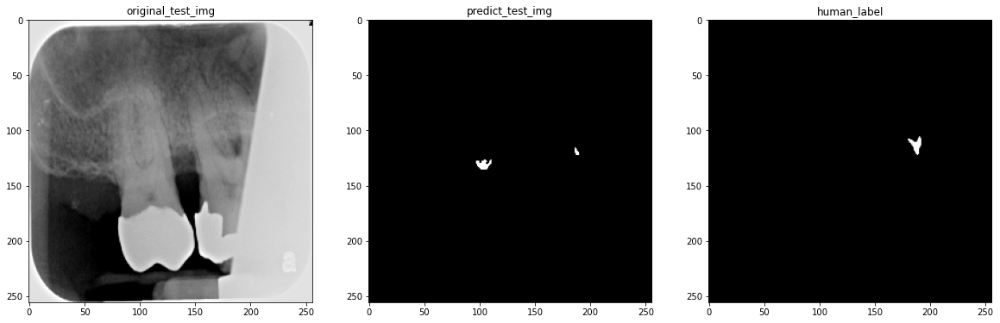


 20%|████████████████▌                                                                  | 4/20 [00:01<00:05,  2.99it/s]

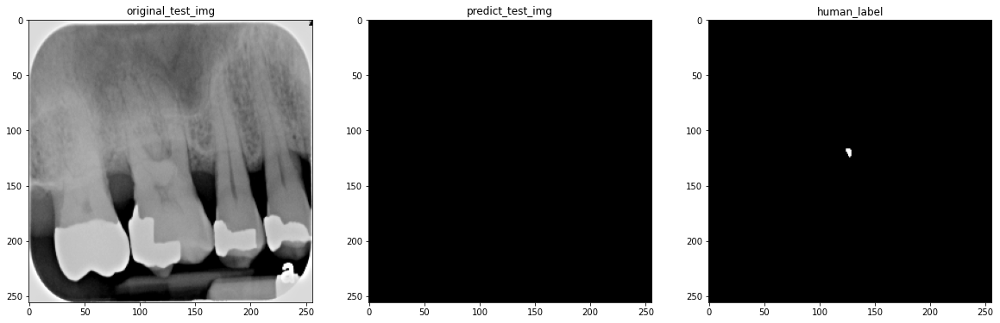


 25%|████████████████████▊                                                              | 5/20 [00:01<00:04,  3.05it/s]

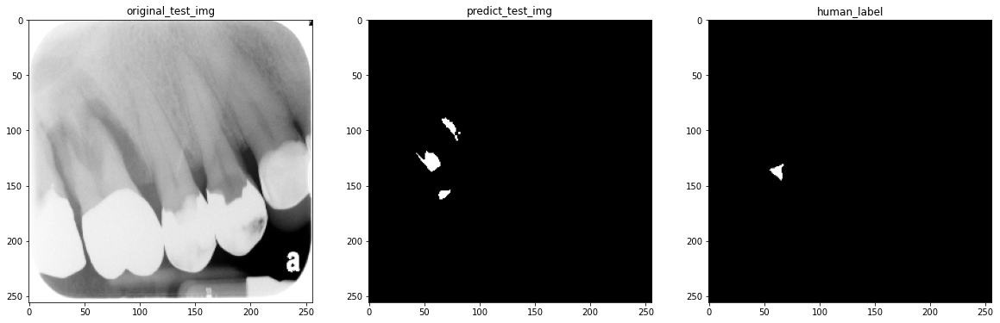


 30%|████████████████████████▉                                                          | 6/20 [00:01<00:04,  3.04it/s]

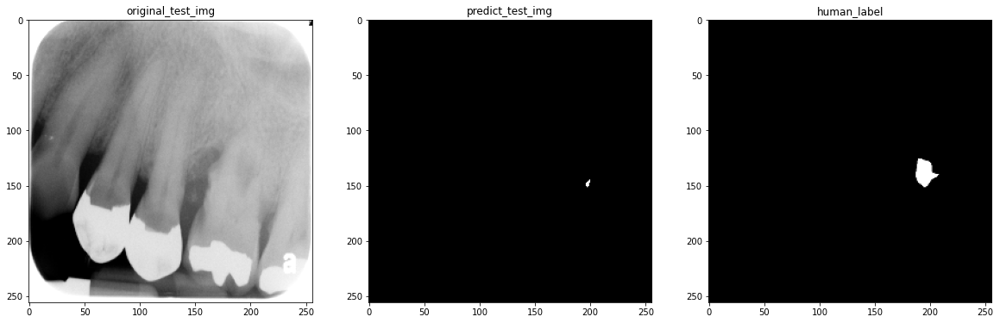


 35%|█████████████████████████████                                                      | 7/20 [00:02<00:04,  2.91it/s]

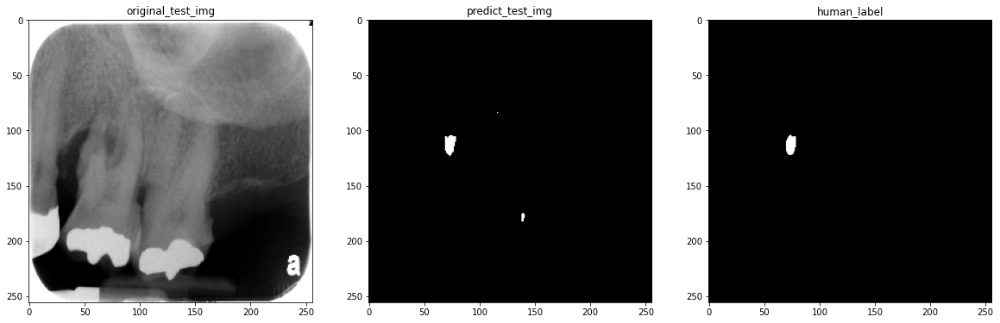


 40%|█████████████████████████████████▏                                                 | 8/20 [00:02<00:04,  2.94it/s]

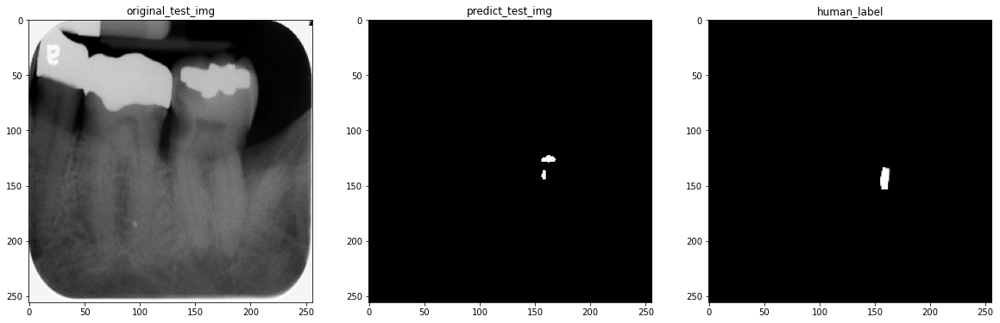


 45%|█████████████████████████████████████▎                                             | 9/20 [00:03<00:03,  2.99it/s]

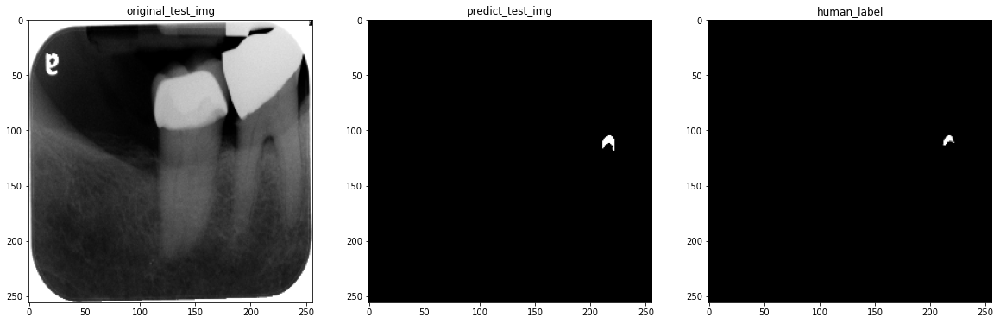


 50%|█████████████████████████████████████████                                         | 10/20 [00:03<00:03,  2.96it/s]

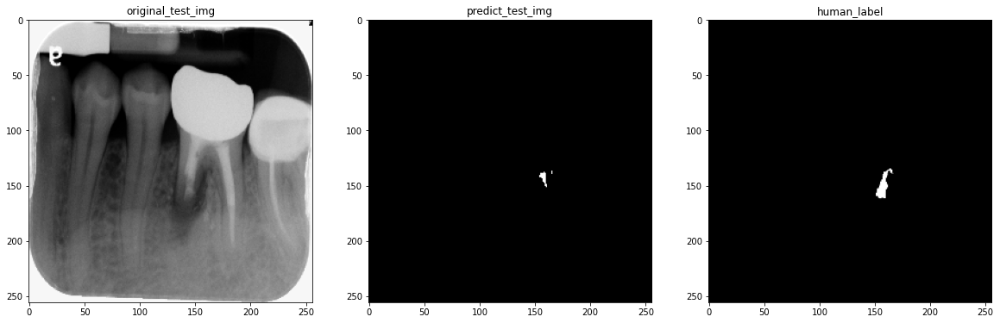


 55%|█████████████████████████████████████████████                                     | 11/20 [00:03<00:02,  3.02it/s]

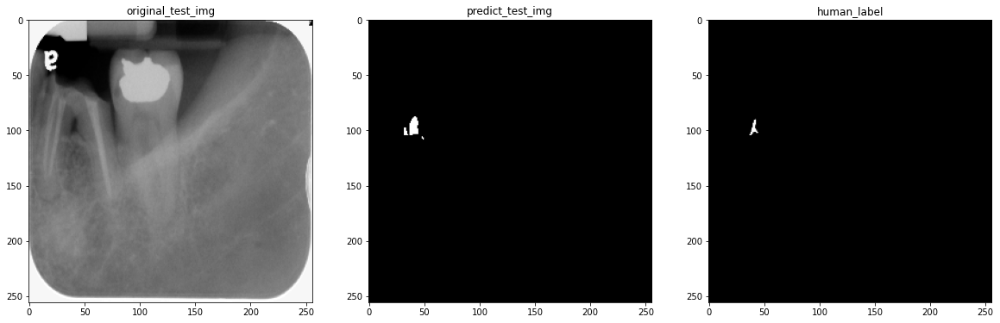


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:04<00:02,  2.78it/s]

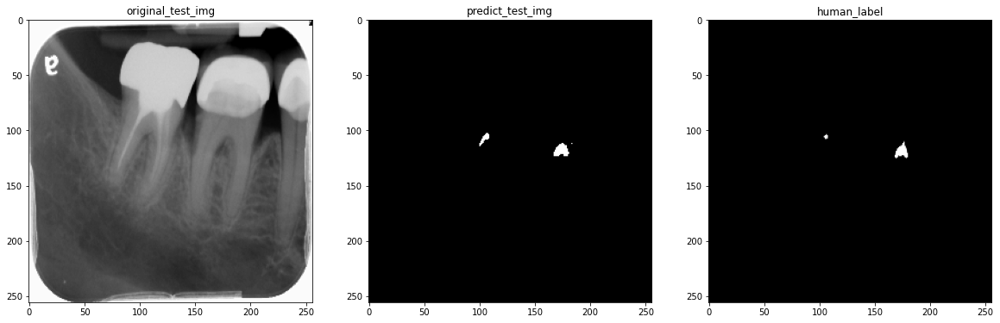


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [00:04<00:02,  2.85it/s]

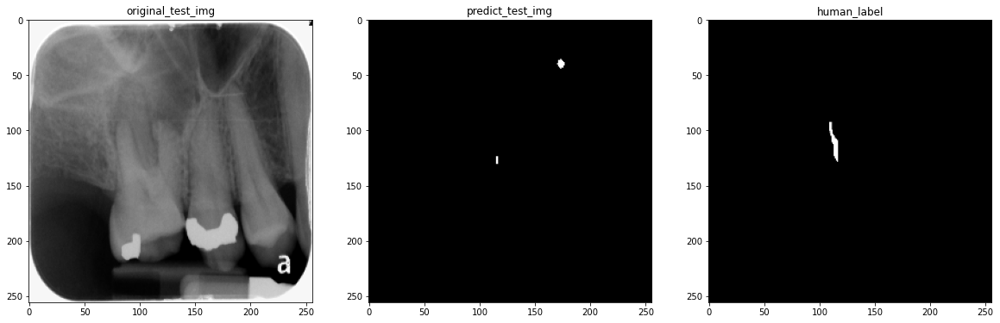


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:04<00:02,  2.94it/s]

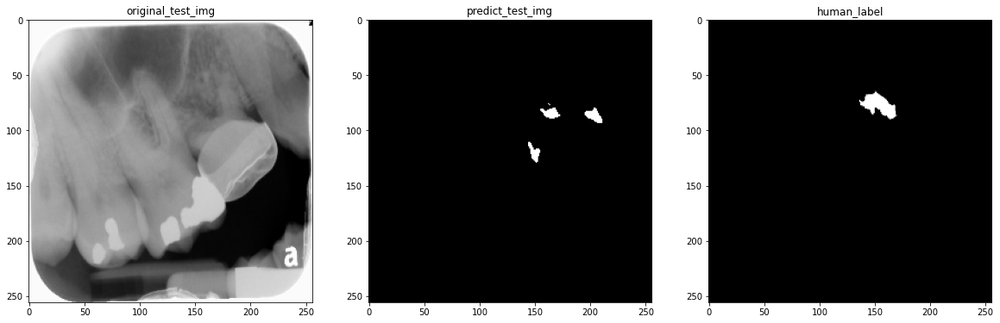


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [00:05<00:01,  2.96it/s]

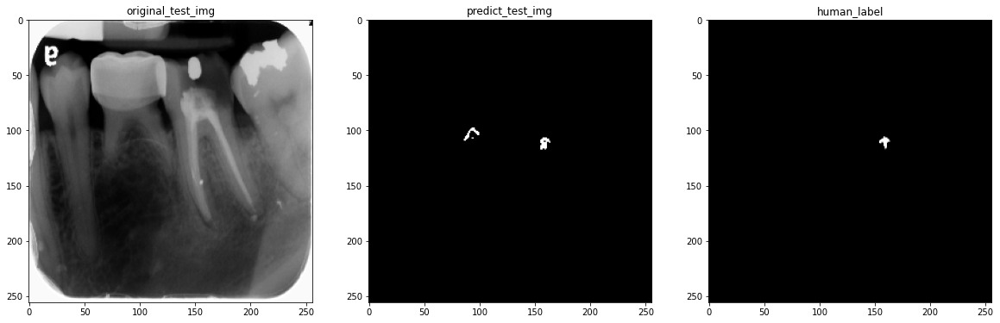


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:05<00:01,  3.02it/s]

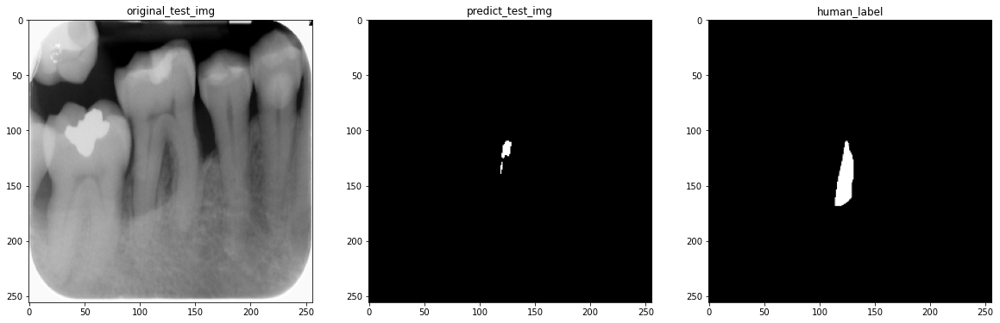


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [00:05<00:00,  3.02it/s]

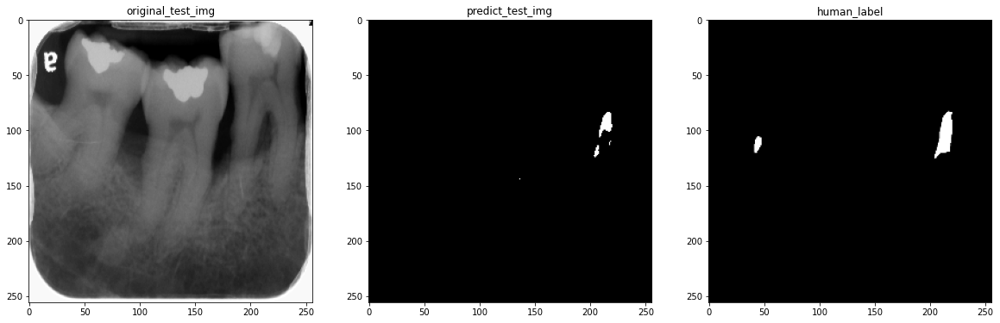


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:06<00:00,  3.07it/s]

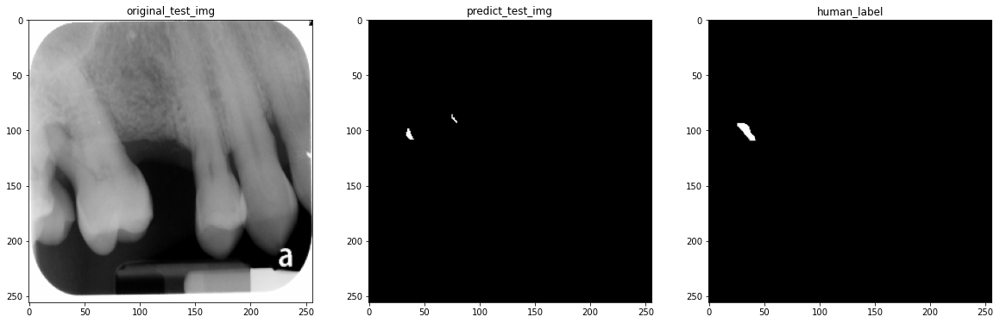


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [00:06<00:00,  3.01it/s]

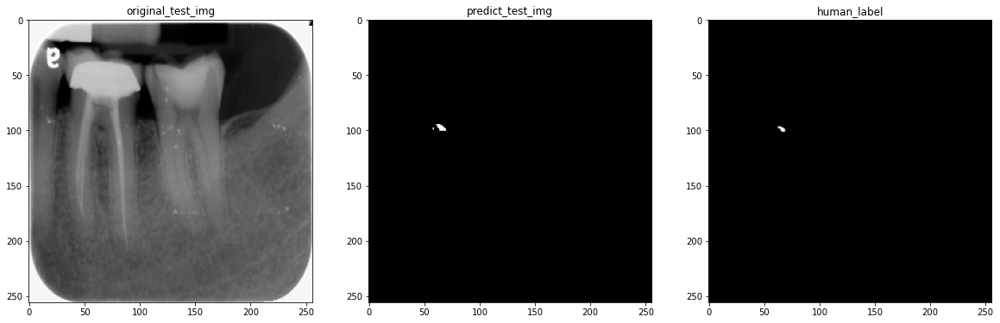


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

group name = group4


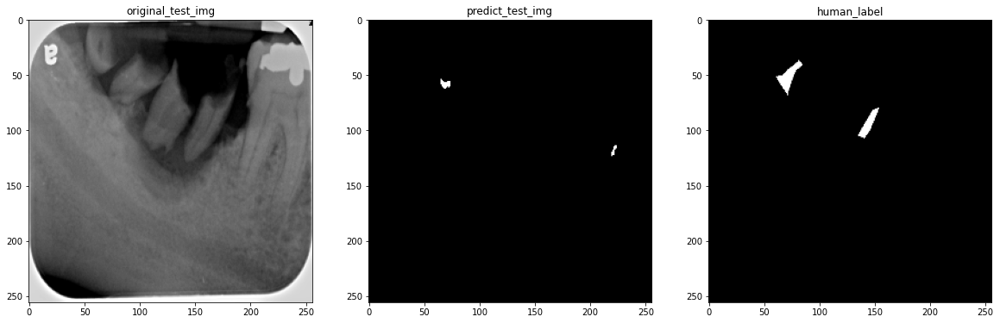


  5%|████▏                                                                              | 1/20 [00:00<00:06,  3.03it/s]

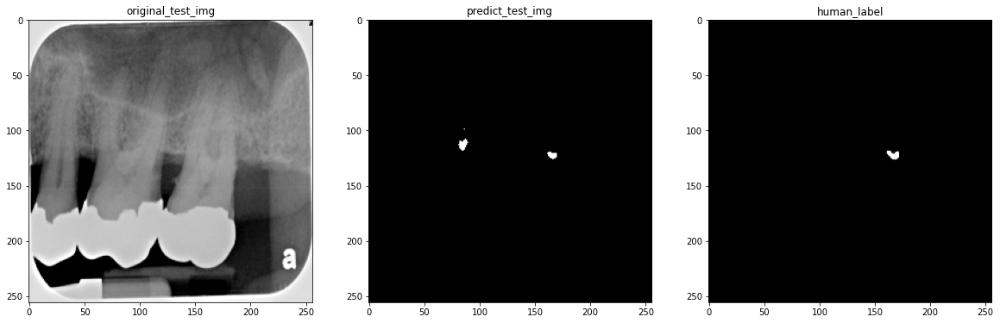


 10%|████████▎                                                                          | 2/20 [00:00<00:06,  2.99it/s]

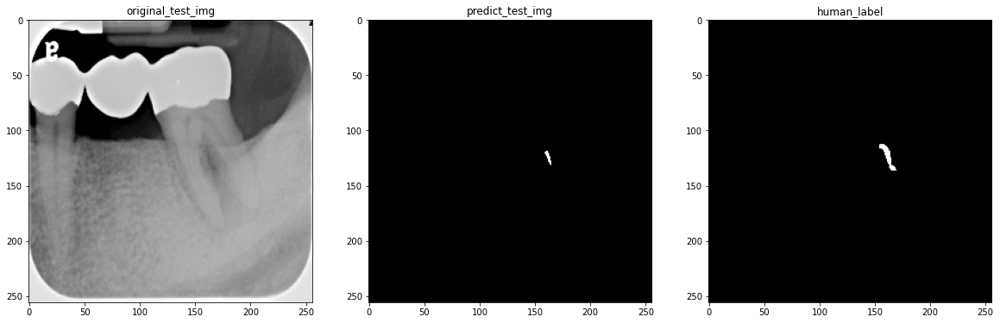


 15%|████████████▍                                                                      | 3/20 [00:01<00:05,  3.00it/s]

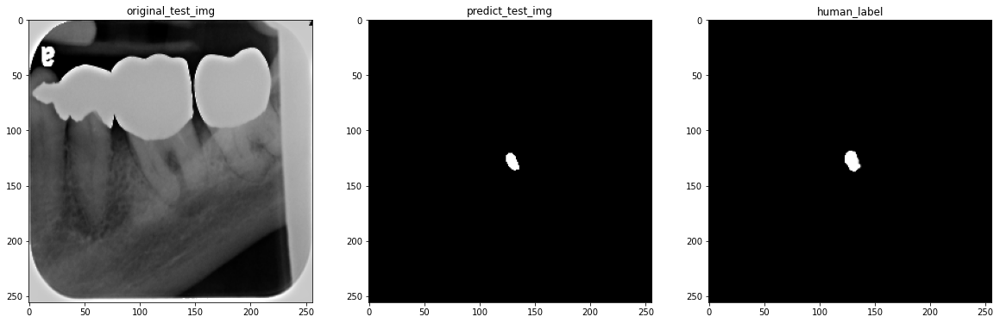


 20%|████████████████▌                                                                  | 4/20 [00:01<00:05,  2.77it/s]

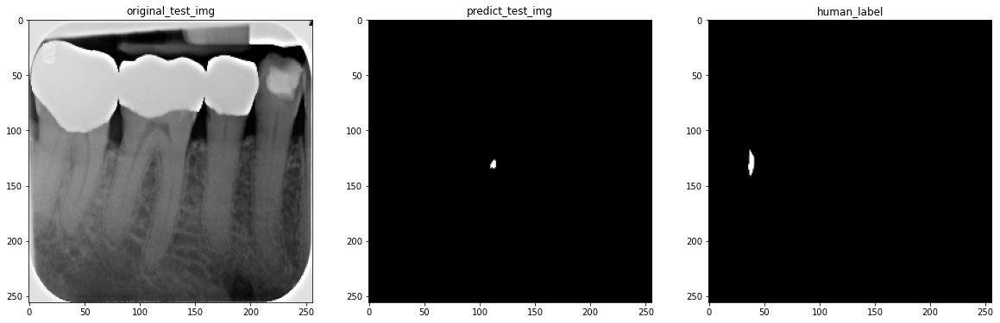


 25%|████████████████████▊                                                              | 5/20 [00:01<00:05,  2.84it/s]

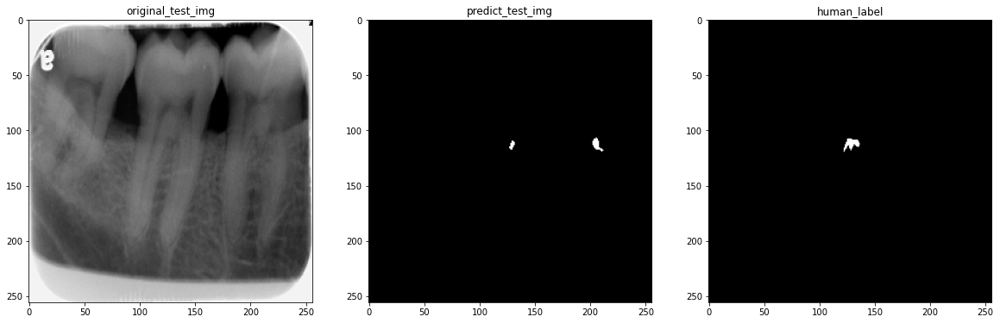


 30%|████████████████████████▉                                                          | 6/20 [00:02<00:04,  2.89it/s]

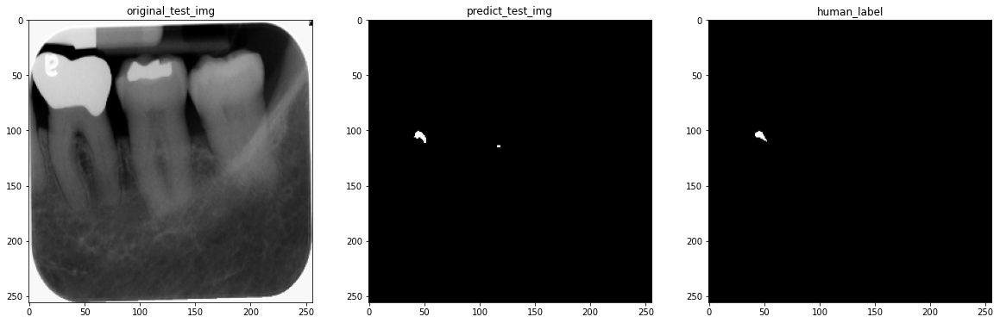


 35%|█████████████████████████████                                                      | 7/20 [00:02<00:04,  2.97it/s]

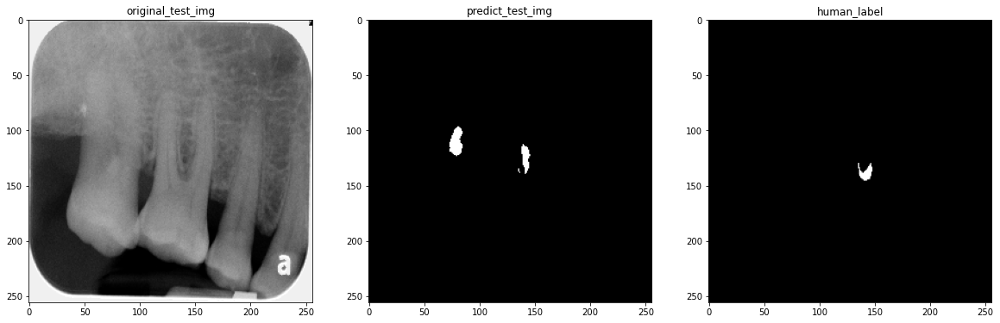


 40%|█████████████████████████████████▏                                                 | 8/20 [00:02<00:04,  2.99it/s]

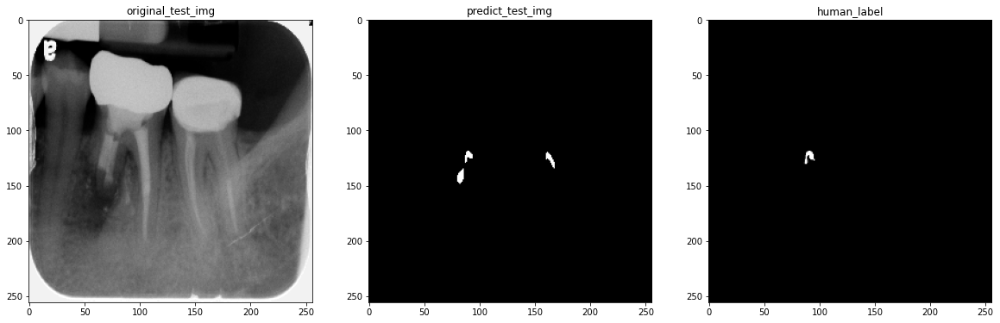


 45%|█████████████████████████████████████▎                                             | 9/20 [00:03<00:03,  2.96it/s]

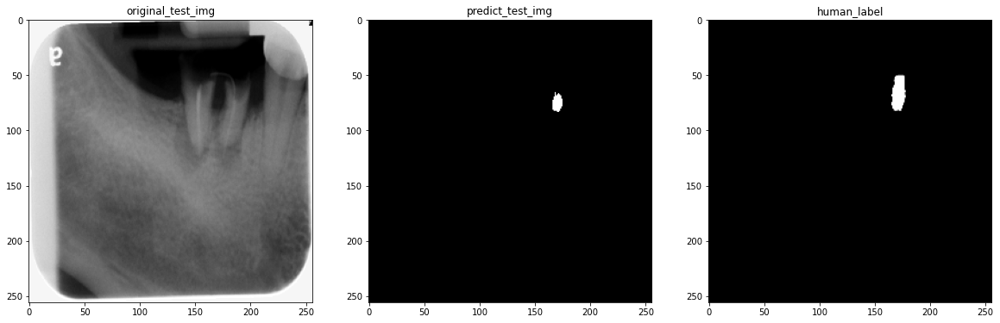


 50%|█████████████████████████████████████████                                         | 10/20 [00:03<00:03,  3.02it/s]

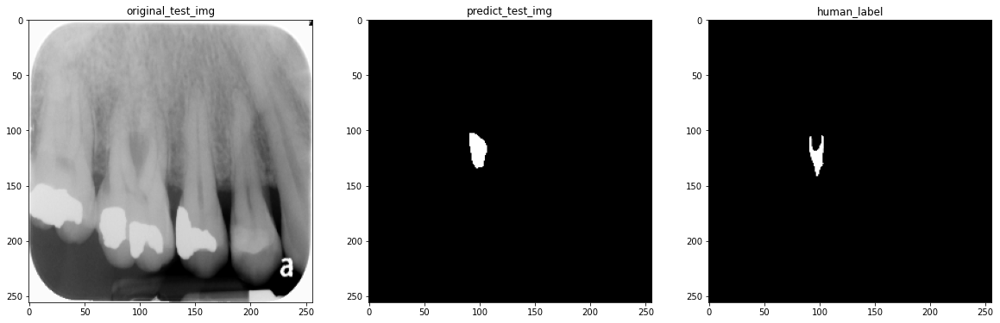


 55%|█████████████████████████████████████████████                                     | 11/20 [00:03<00:02,  3.02it/s]

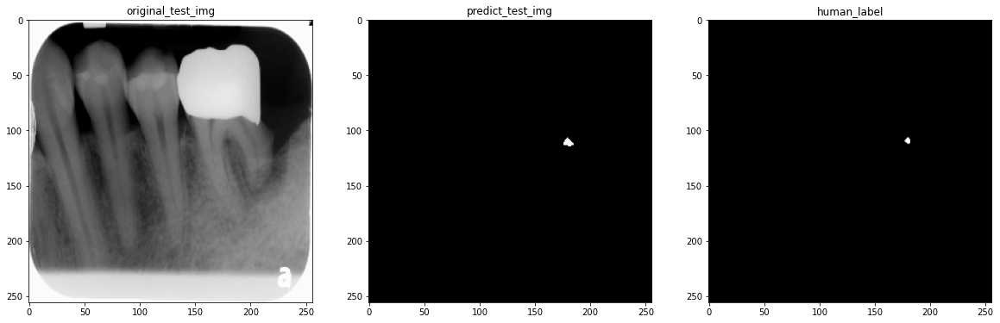


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:04<00:02,  3.07it/s]

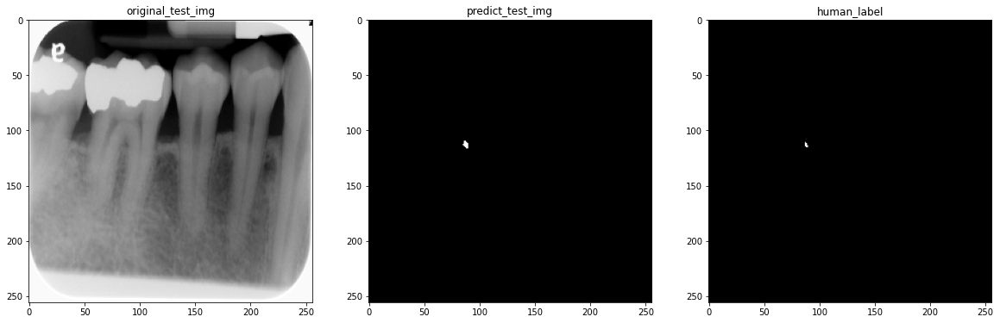


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [00:04<00:02,  3.05it/s]

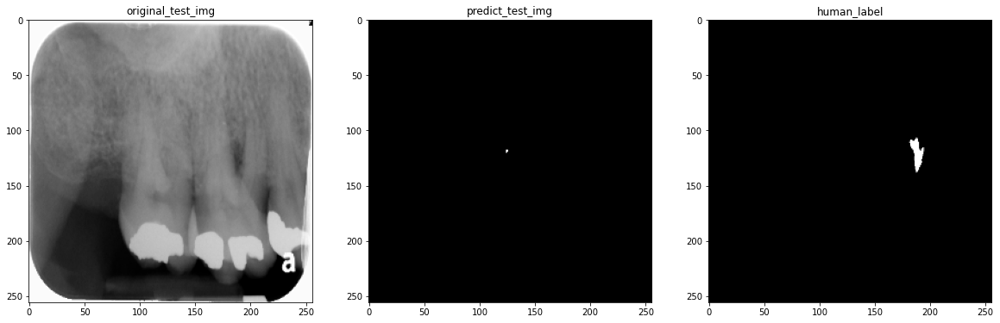


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:04<00:01,  3.04it/s]

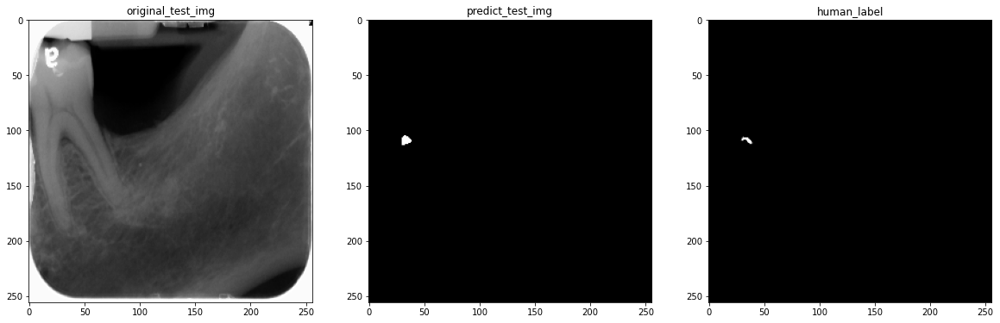


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [00:05<00:01,  3.08it/s]

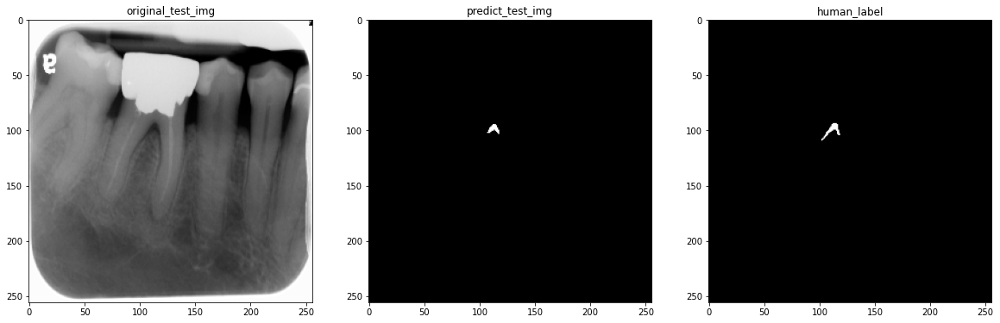


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:05<00:01,  2.82it/s]

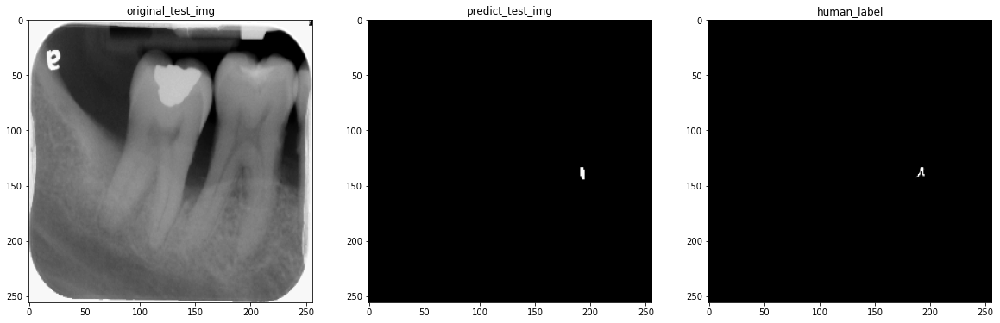


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [00:05<00:01,  2.91it/s]

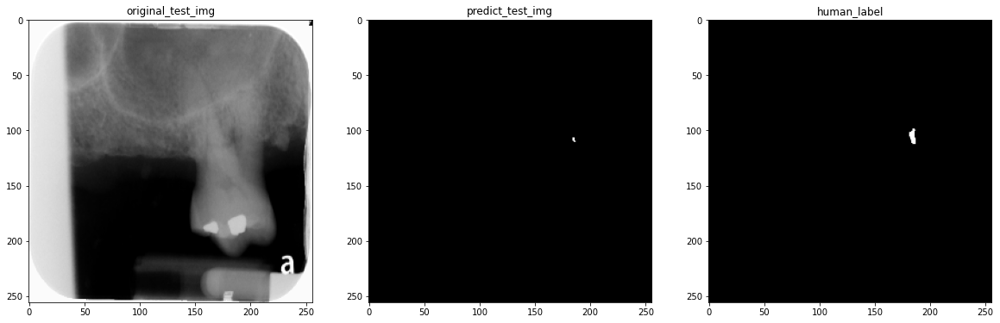


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:06<00:00,  2.94it/s]

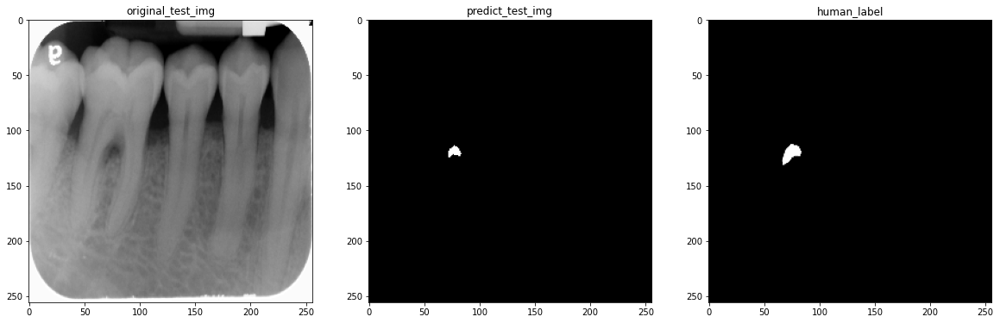


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [00:06<00:00,  2.97it/s]

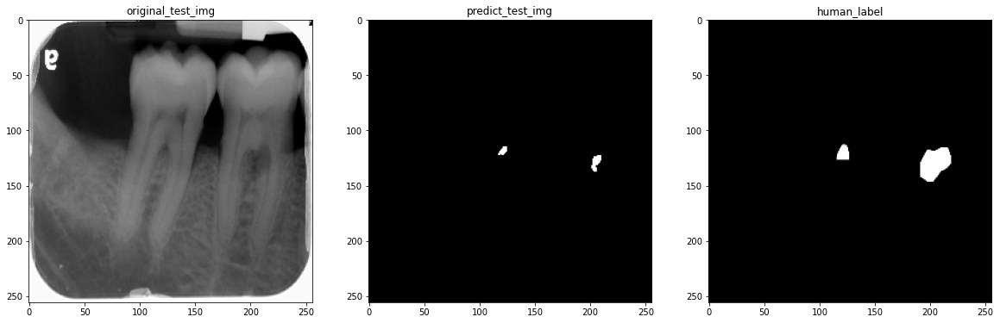


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

group name = group5


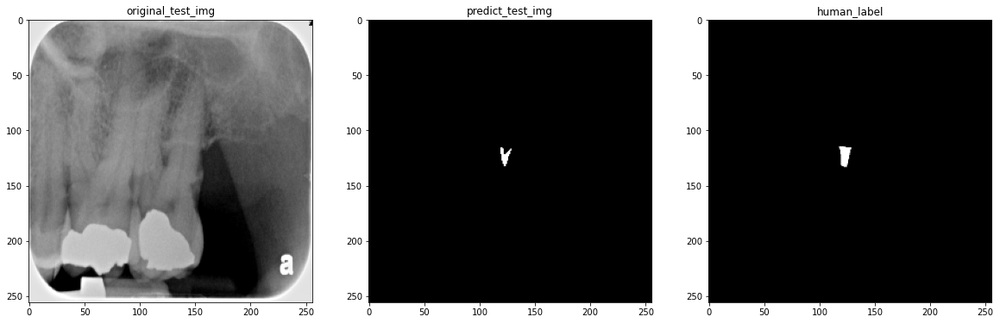


  5%|████▏                                                                              | 1/20 [00:00<00:06,  3.05it/s]

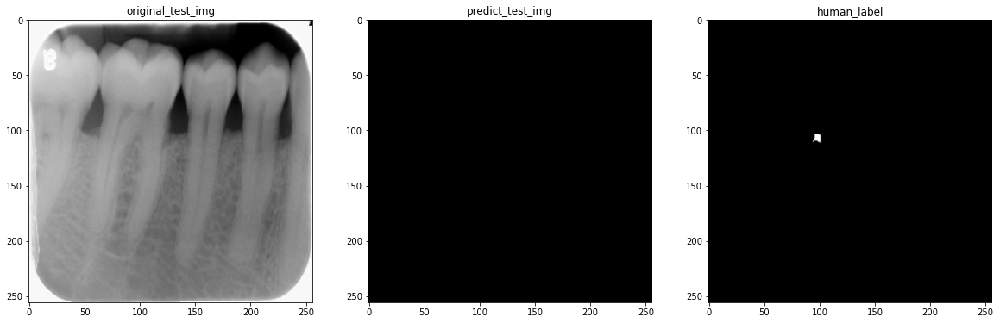


 10%|████████▎                                                                          | 2/20 [00:00<00:05,  3.04it/s]

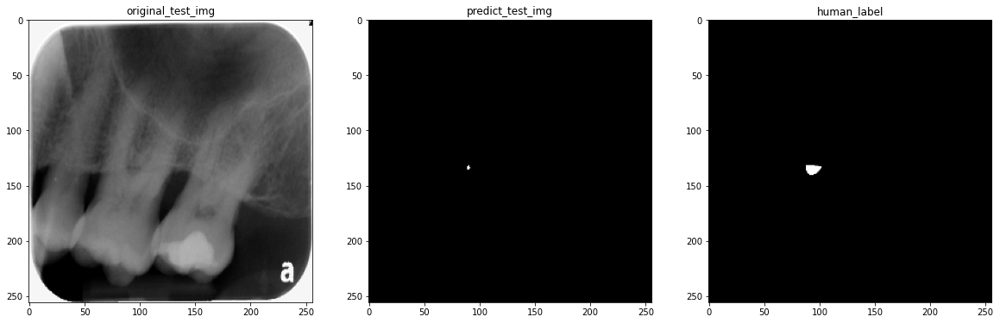


 15%|████████████▍                                                                      | 3/20 [00:00<00:05,  3.04it/s]

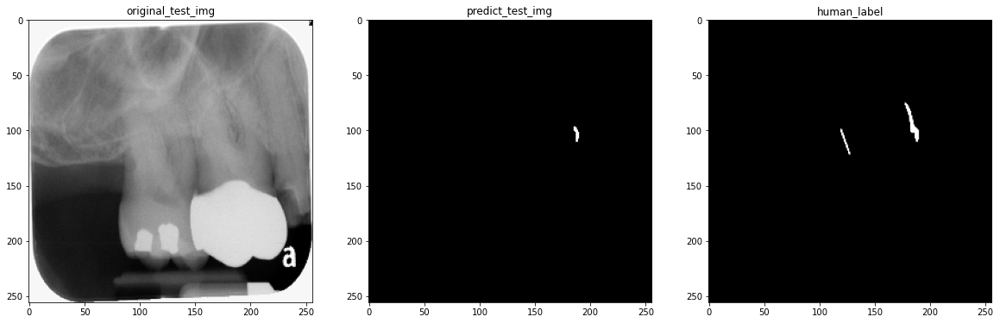


 20%|████████████████▌                                                                  | 4/20 [00:01<00:05,  3.03it/s]

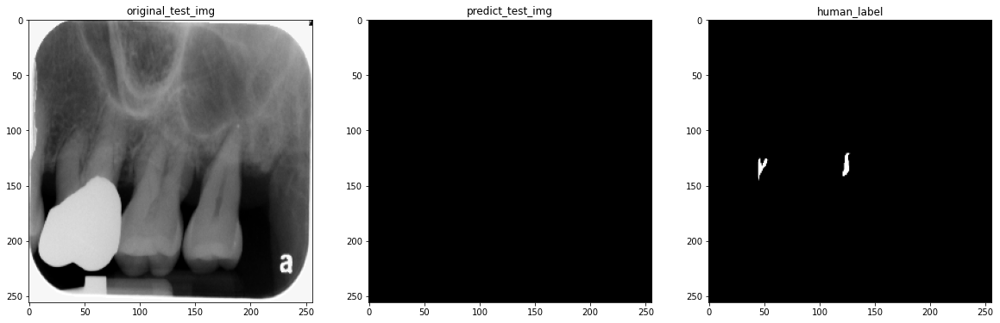


 25%|████████████████████▊                                                              | 5/20 [00:01<00:05,  2.99it/s]

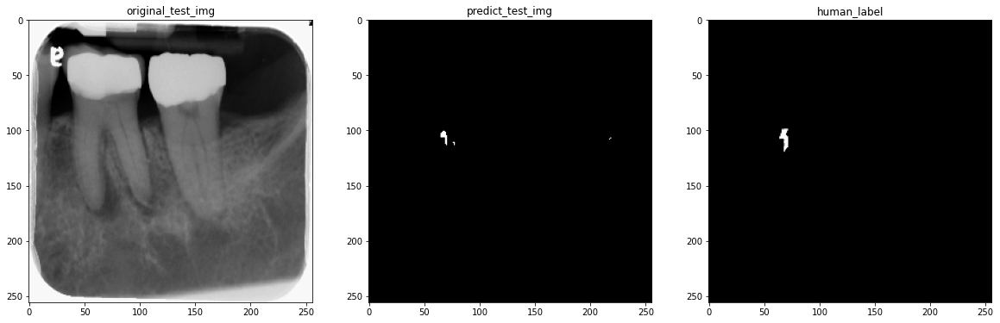


 30%|████████████████████████▉                                                          | 6/20 [00:01<00:04,  3.04it/s]

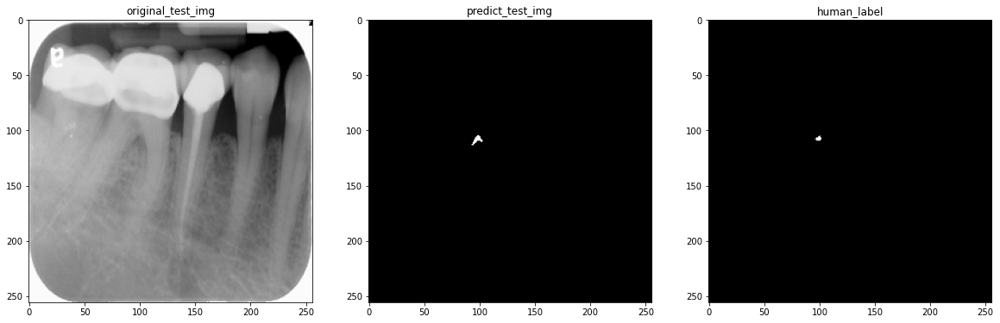


 35%|█████████████████████████████                                                      | 7/20 [00:02<00:04,  3.04it/s]

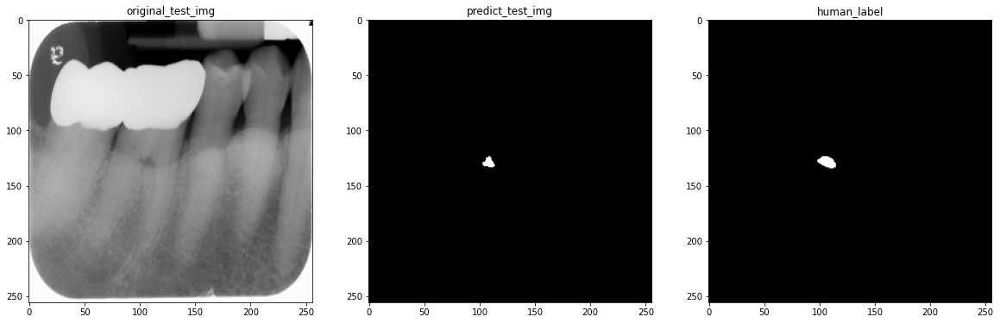


 40%|█████████████████████████████████▏                                                 | 8/20 [00:02<00:04,  2.72it/s]

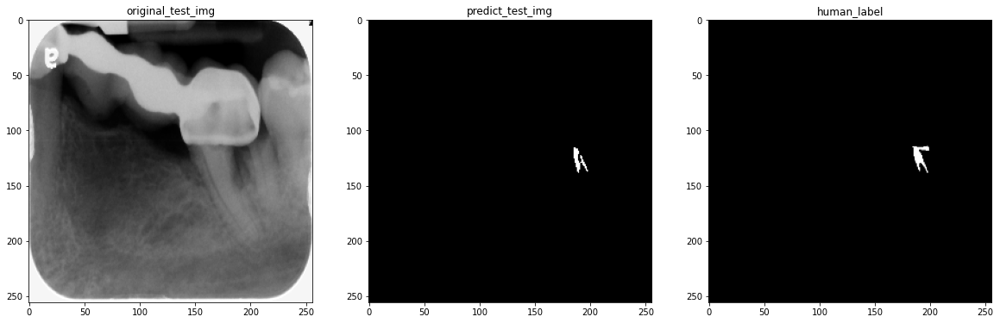


 45%|█████████████████████████████████████▎                                             | 9/20 [00:03<00:03,  2.81it/s]

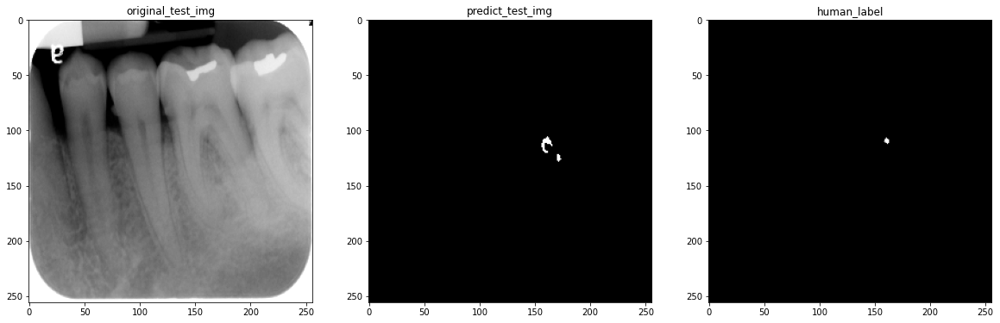


 50%|█████████████████████████████████████████                                         | 10/20 [00:03<00:03,  2.87it/s]

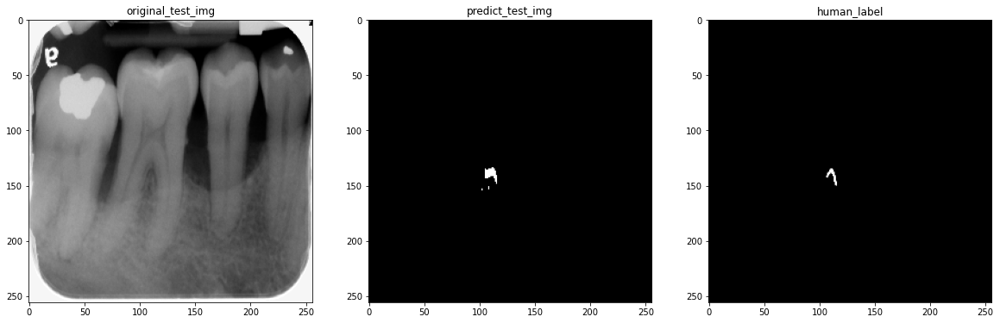


 55%|█████████████████████████████████████████████                                     | 11/20 [00:03<00:03,  2.95it/s]

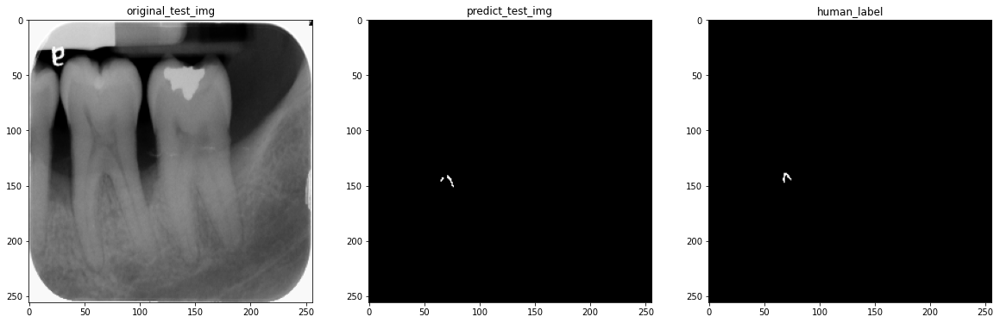


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:04<00:02,  2.97it/s]

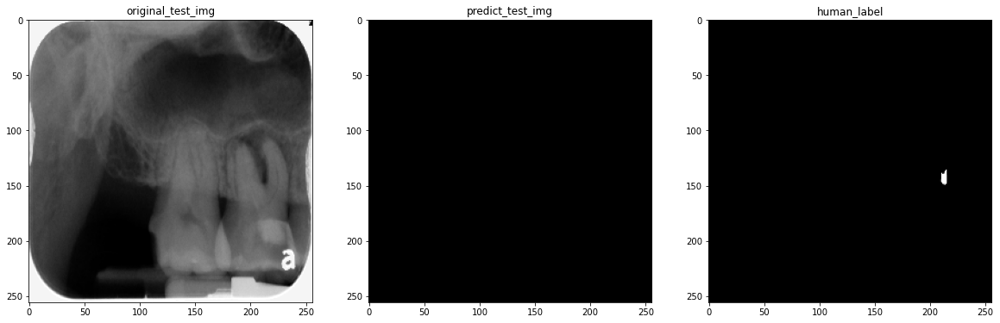


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [00:04<00:02,  3.03it/s]

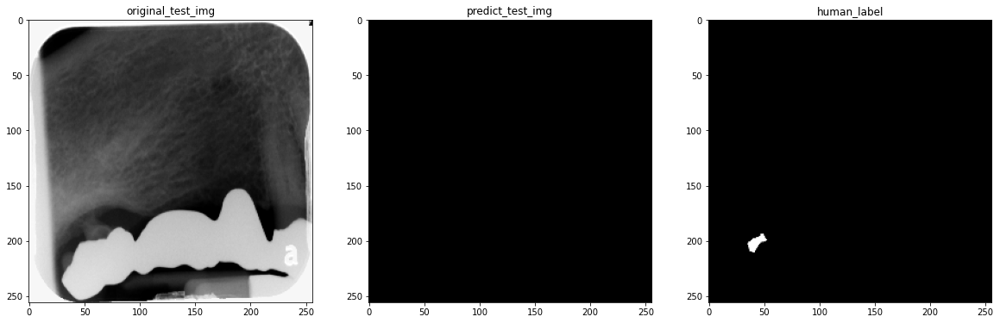


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:04<00:02,  2.98it/s]

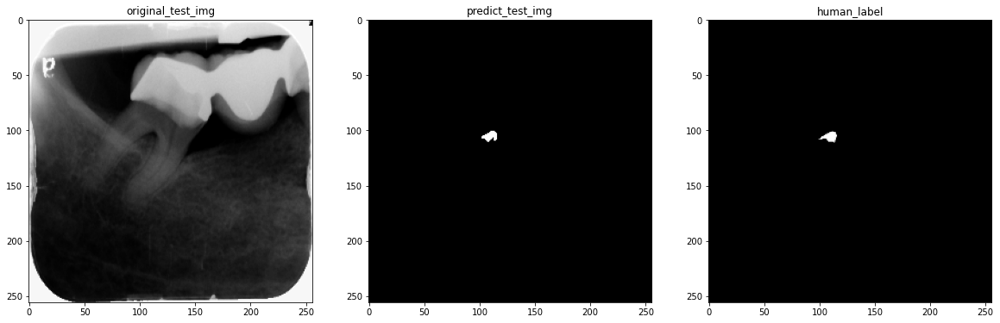


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [00:05<00:01,  3.04it/s]

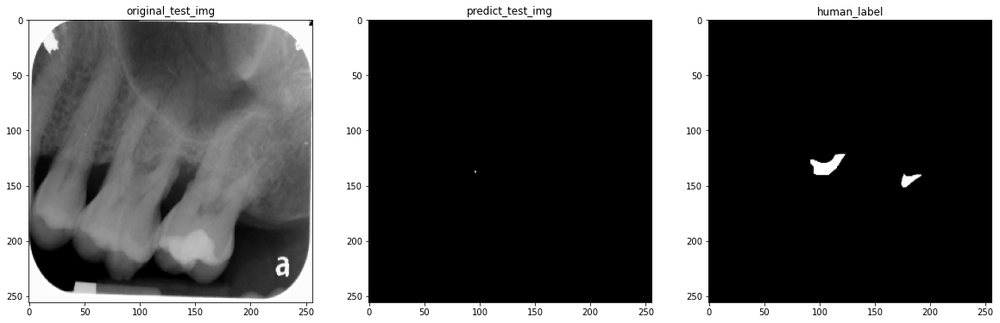


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:05<00:01,  2.99it/s]

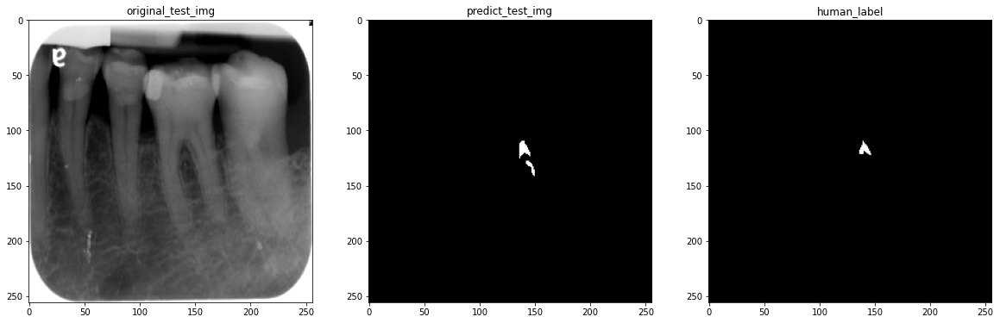


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [00:05<00:00,  3.05it/s]

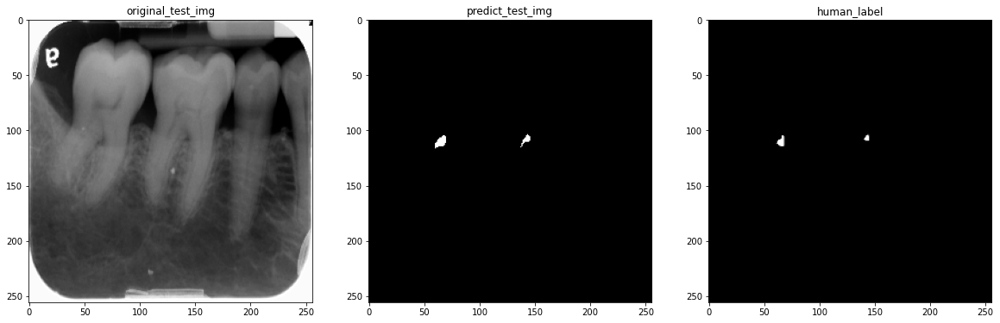


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:06<00:00,  3.08it/s]

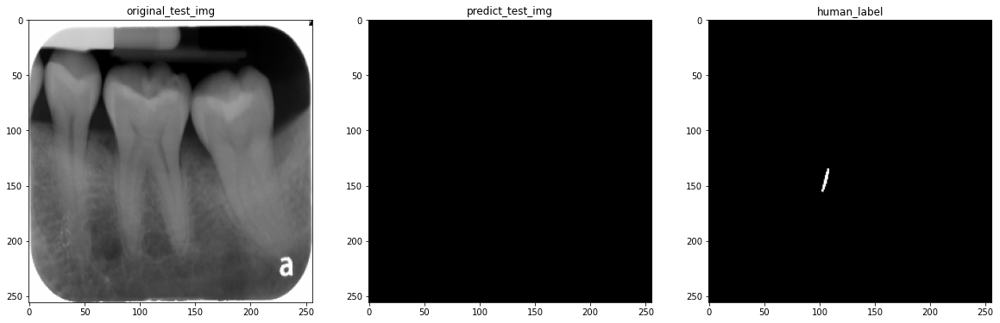


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [00:06<00:00,  3.07it/s]

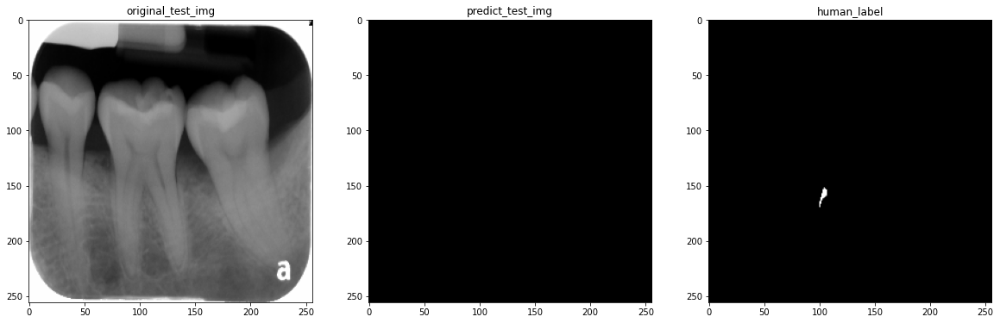


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

group name = group6


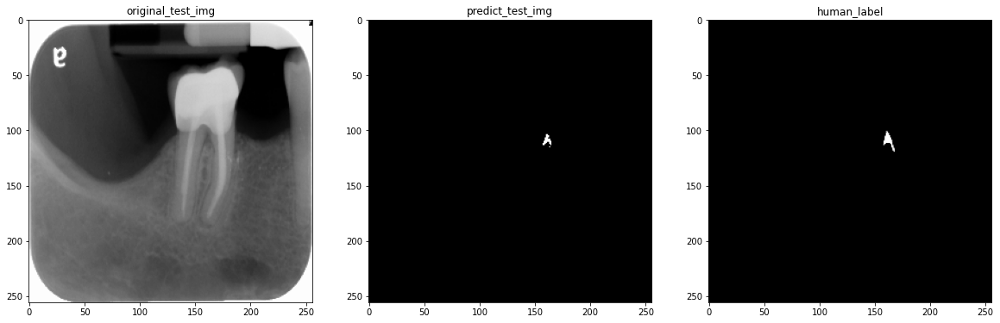


  5%|████▏                                                                              | 1/20 [00:00<00:06,  3.13it/s]

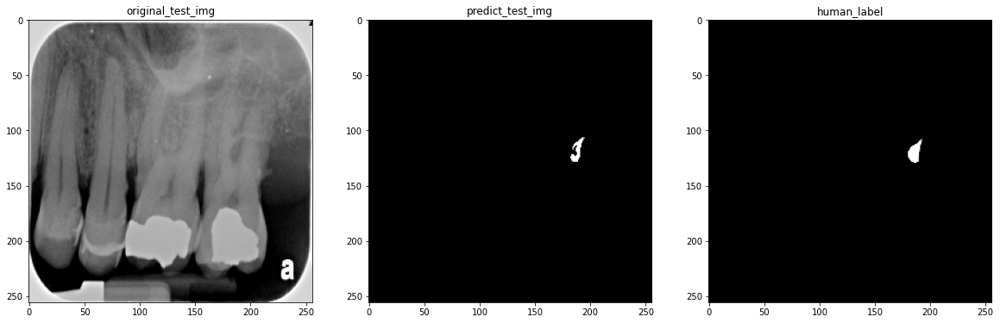


 10%|████████▎                                                                          | 2/20 [00:00<00:05,  3.05it/s]

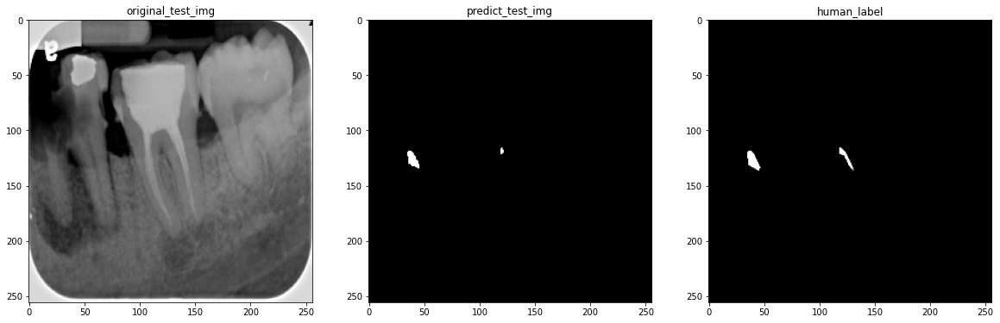


 15%|████████████▍                                                                      | 3/20 [00:00<00:05,  3.04it/s]

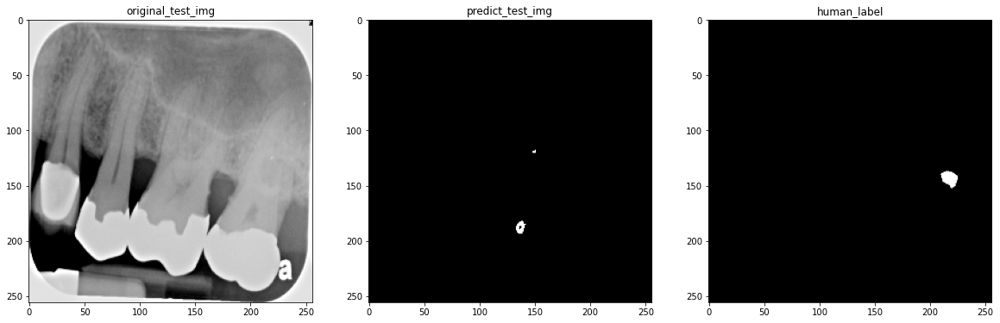


 20%|████████████████▌                                                                  | 4/20 [00:01<00:05,  2.99it/s]

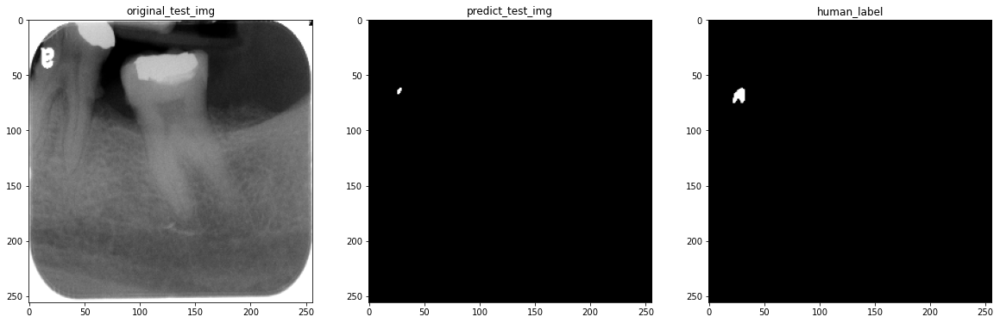


 25%|████████████████████▊                                                              | 5/20 [00:01<00:04,  3.00it/s]

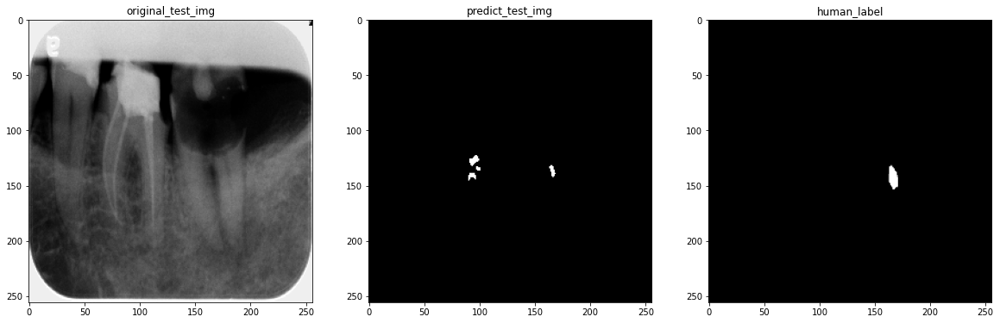


 30%|████████████████████████▉                                                          | 6/20 [00:01<00:04,  3.05it/s]

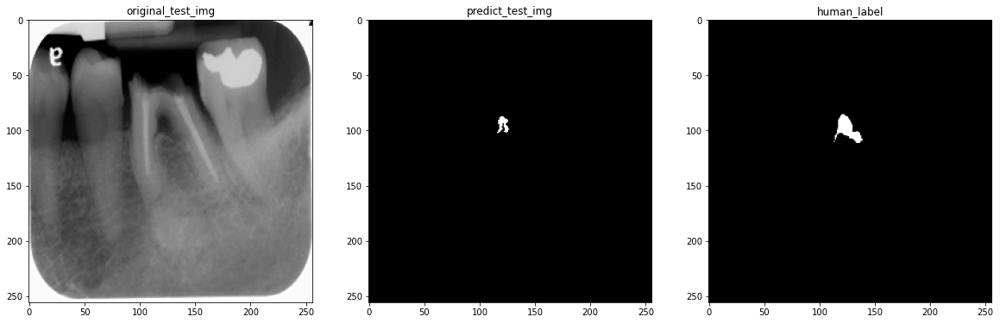


 35%|█████████████████████████████                                                      | 7/20 [00:02<00:04,  3.04it/s]

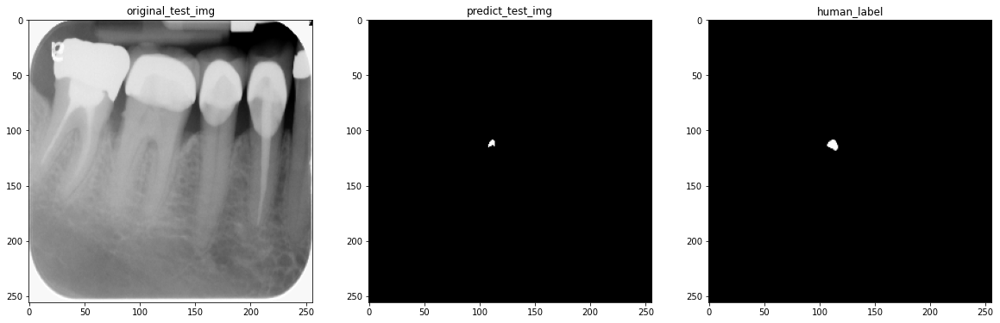


 40%|█████████████████████████████████▏                                                 | 8/20 [00:02<00:03,  3.04it/s]

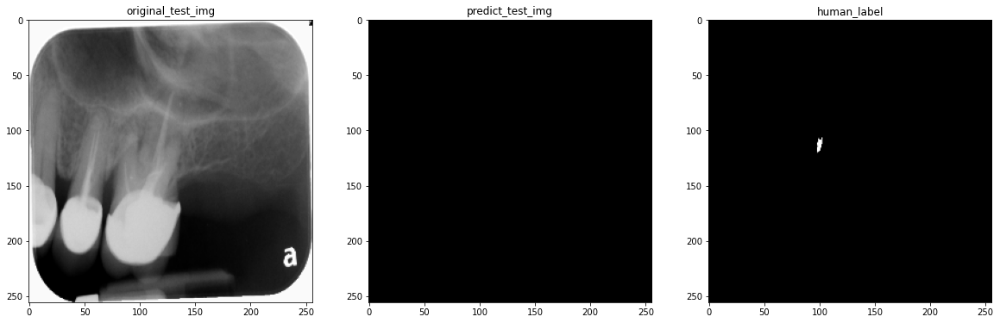


 45%|█████████████████████████████████████▎                                             | 9/20 [00:02<00:03,  3.03it/s]

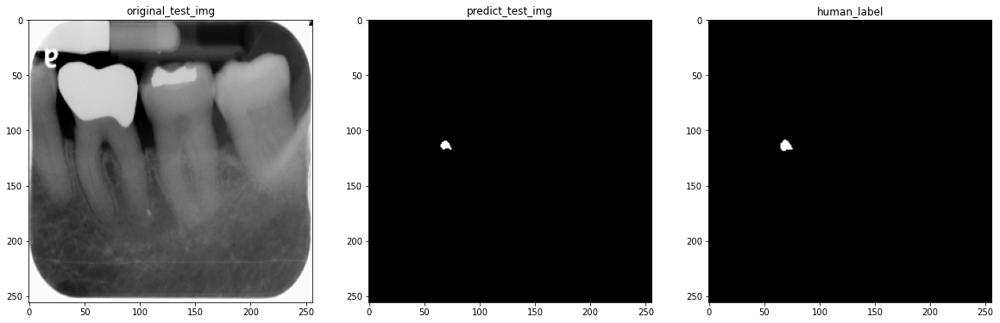


 50%|█████████████████████████████████████████                                         | 10/20 [00:03<00:03,  3.03it/s]

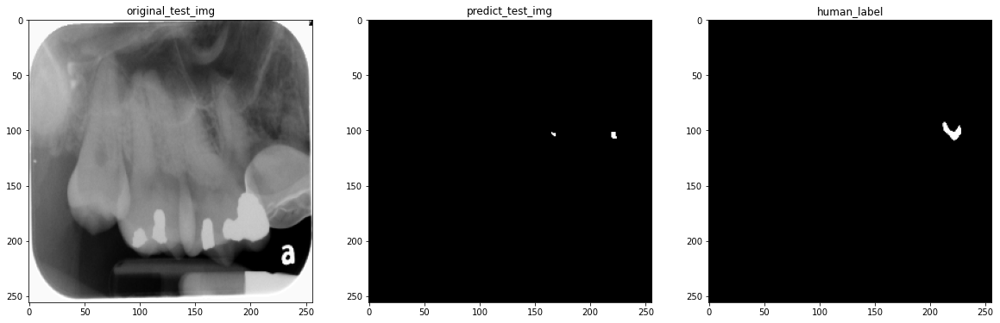


 55%|█████████████████████████████████████████████                                     | 11/20 [00:03<00:02,  3.07it/s]

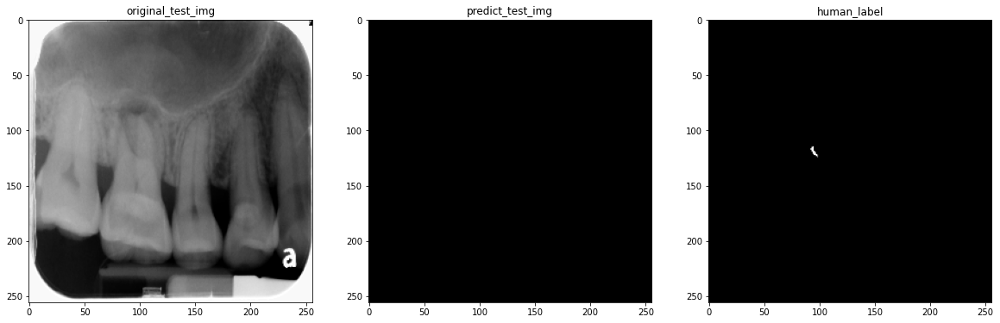


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:04<00:02,  2.82it/s]

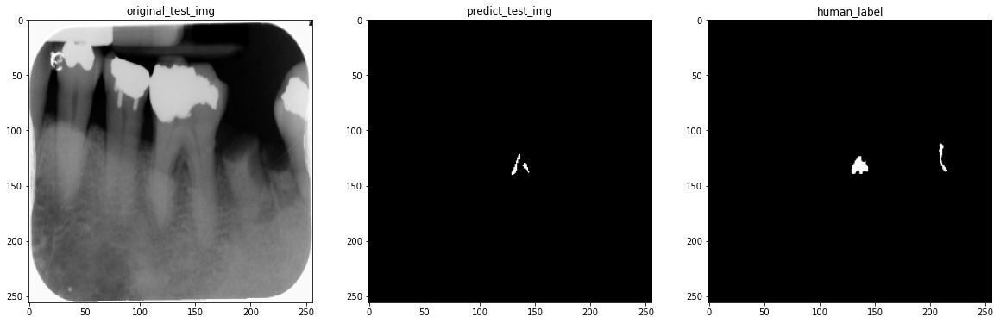


 65%|█████████████████████████████████████████████████████▎                            | 13/20 [00:04<00:02,  2.87it/s]

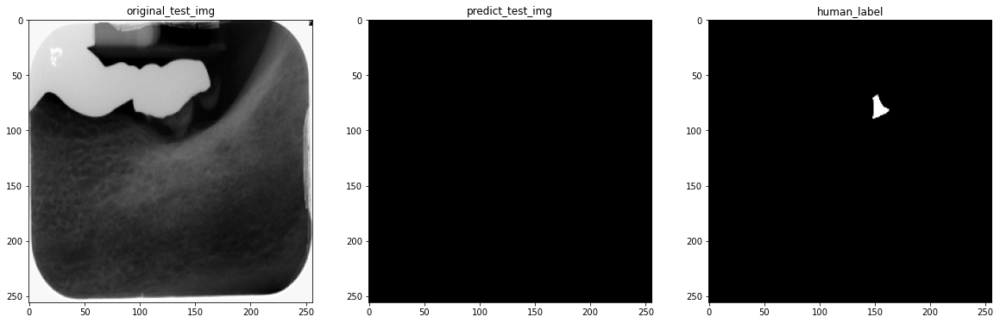


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:04<00:02,  2.95it/s]

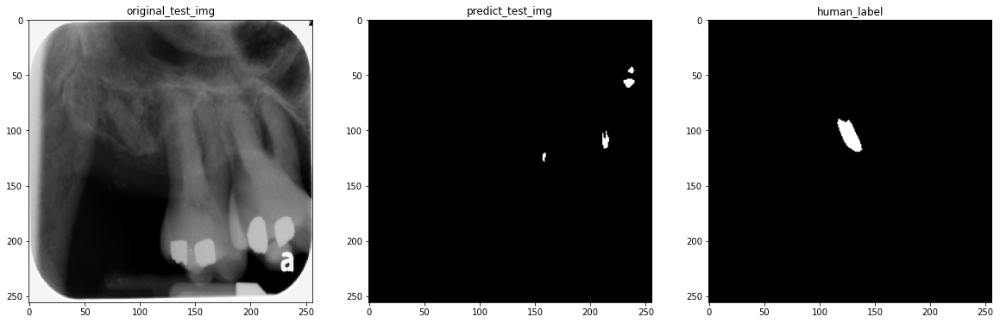


 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [00:05<00:01,  2.97it/s]

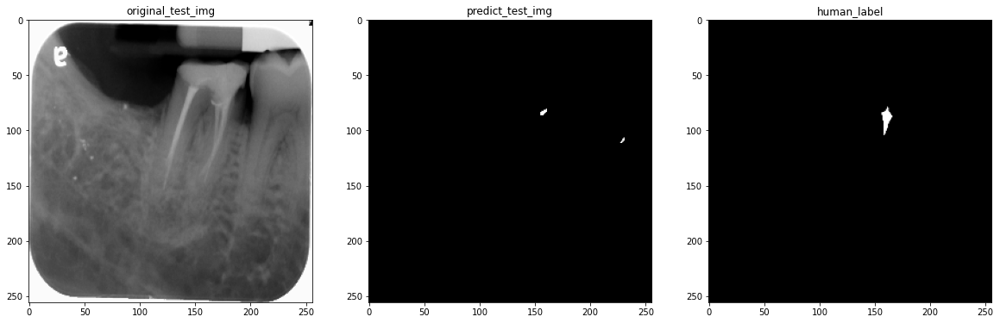


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:05<00:01,  2.99it/s]

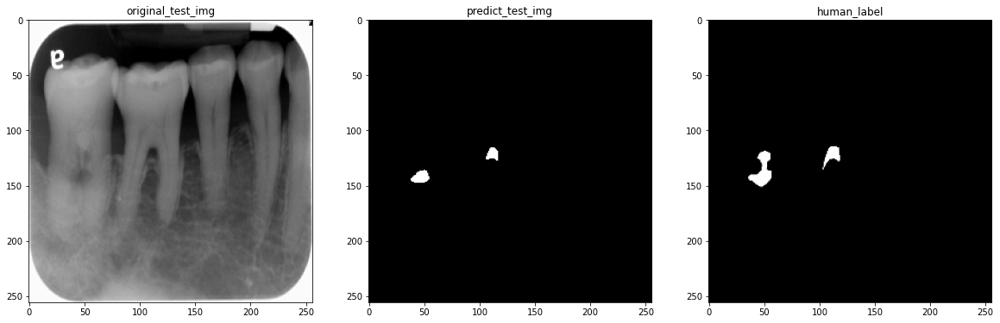


 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [00:05<00:00,  3.04it/s]

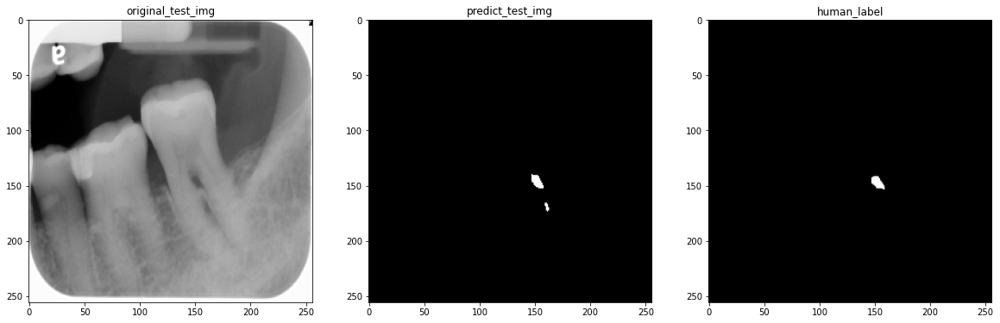


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:06<00:00,  3.04it/s]

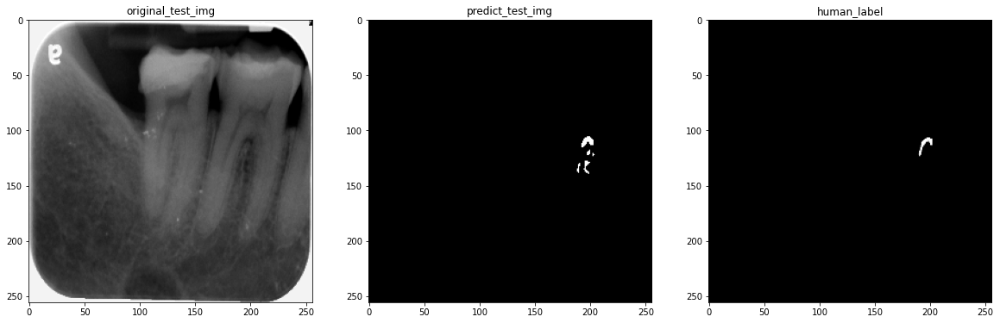


 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [00:06<00:00,  3.03it/s]

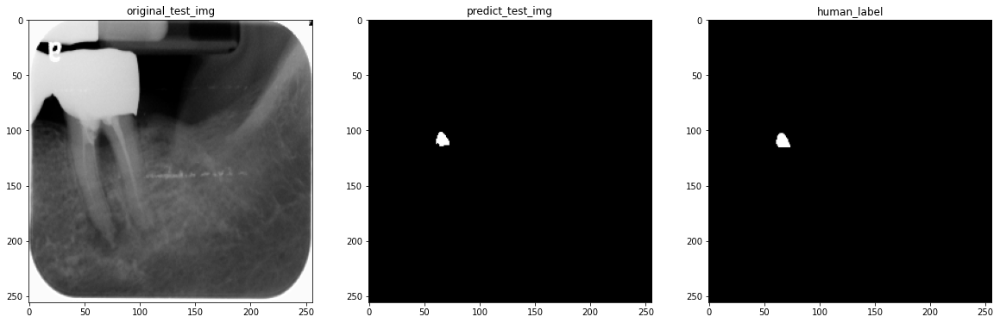


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:40<00:00,  6.82s/it]


In [17]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
#group_list = ['group5']

for group_name in tqdm(group_list, total = len(group_list)):
    print('group name =',group_name)
    test_folder = os.path.join(k_fold_folder_path,group_name, 'skip_data', 'image')
    test_img_path_list = glob.glob(test_folder+'/*.PNG')
    show_k_fold_result(test_img_path_list)

In [ ]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)

for group_name in tqdm(group_list, total = len(group_list)):
    test_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'image')
    result_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'prediction')
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    test_k_group_in_skip_data(test_folder, result_folder, model_save_total_path)

In [5]:
test_folder = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/dataset/buccal_furcation_train/k_fold_learning/group5/image'
result_folder = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/dataset/buccal_furcation_train/k_fold_learning/group5/train_pre'
model_save_total_path = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/buccal_furcation_bi_unet_k-fold-learning_group5.hdf5'

test_k_group_in_skip_data(test_folder, result_folder, model_save_total_path)

/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/unet/model.py:56: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`
  model = Model(input = inputs, output = conv10)
100%|██████████| 101/101 [00:08<00:00, 11.62it/s]


In [1]:
import sys 
sys.path

['/usr/lib/python36.zip',
 '/usr/lib/python3.6',
 '/usr/lib/python3.6/lib-dynload',
 '',
 '/home/jingping/.local/lib/python3.6/site-packages',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.6/dist-packages/IPython/extensions',
 '/home/jingping/.ipython']